In [1]:
from __future__ import print_function
import cv2
import numpy as np
from numpy import pi, exp, sqrt
import pickle
from matplotlib import pyplot as plt
from IPython import display
import time
#import pylab as pl

%matplotlib inline 
#notebook or inline

###https://www.learnopencv.com/image-alignment-feature-based-using-opencv-c-python/

MAX_FEATURES = 500
GOOD_MATCH_PERCENT = 0.15

def alignImages(im1, im2, matchfilename = 'matches.jpg'):
    # Convert images to grayscale
    #im1Gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
    #im2Gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
    im1Gray = im1
    im2Gray = im2

    # Detect ORB features and compute descriptors.
    orb = cv2.ORB_create(MAX_FEATURES)
    keypoints1, descriptors1 = orb.detectAndCompute(im1Gray, None)
    keypoints2, descriptors2 = orb.detectAndCompute(im2Gray, None)

    # Match features.
    matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
    matches = matcher.match(descriptors1, descriptors2, None)

    # Sort matches by score
    matches.sort(key=lambda x: x.distance, reverse=False)

    # Remove not so good matches
    numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
    matches = matches[:numGoodMatches]

    # Draw top matches
    imMatches = cv2.drawMatches(im1, keypoints1, im2, keypoints2, matches, None)
    cv2.imwrite(matchfilename, imMatches)

    # Extract location of good matches
    points1 = np.zeros((len(matches), 2), dtype=np.float32)
    points2 = np.zeros((len(matches), 2), dtype=np.float32)
 
    for i, match in enumerate(matches):
        points1[i, :] = keypoints1[match.queryIdx].pt
        points2[i, :] = keypoints2[match.trainIdx].pt
   
    # Find homography
    h, mask = cv2.findHomography(points1, points2, cv2.RANSAC)

    # Use homography
    height, width = im2.shape
    #height, width, channels = im2.shape
    im1Reg = cv2.warpPerspective(im1, h, (width, height))

    return im1Reg, h



def alignImages_light(im1, im2):

    # Detect ORB features and compute descriptors.
    orb = cv2.ORB_create(MAX_FEATURES)
    keypoints1, descriptors1 = orb.detectAndCompute(im1, None)
    keypoints2, descriptors2 = orb.detectAndCompute(im2, None)

    # Match features.
    matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
    matches = matcher.match(descriptors1, descriptors2, None)

    # Sort matches by score
    matches.sort(key=lambda x: x.distance, reverse=False)

    # Remove not so good matches
    numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
    matches = matches[:numGoodMatches]

    # Extract location of good matches
    points1 = np.zeros((len(matches), 2), dtype=np.float32)
    points2 = np.zeros((len(matches), 2), dtype=np.float32)
 
    for i, match in enumerate(matches):
        points1[i, :] = keypoints1[match.queryIdx].pt
        points2[i, :] = keypoints2[match.trainIdx].pt
   
    # Find homography
    #h, mask = cv2.findHomography(points1, points2, cv2.RANSAC)

    # Use homography
    #height, width = im2.shape
    #height, width, channels = im2.shape
    #im1Reg = cv2.warpPerspective(im1, h, (width, height))
    
    
    # Find 
    # Find homography
    h, mask = cv2.estimateAffinePartial2D(points1, points2, cv2.RANSAC)

    # Use homography
    height, width = im2.shape
    im1Reg = cv2.warpAffine(im1, h, (width, height))

    
    return im1Reg, h

def normalize(x):
    x = (x - np.min(x))/(np.max(x)-np.min(x))
    #x = (x - np.percentile(x,10))/(np.percentile(x,90)-np.percentile(x,10))
    return x

def twodgaussian(s,r):
    #  generate a (2k+1)x(2k+1) gaussian kernel with mean=0 and sigma = s
    probs = [exp(-z*z/(2*s*s))/sqrt(2*pi*s*s) for z in range(-r,r+1)] 
    kernel = np.outer(probs, probs)
    return kernel

In [3]:
import os
# make folder to contain connected files
#os.makedirs('..\\connected',exist_ok=True)

downscaling = 1
Radius = 35/2;#35/2; #mm
Res = 600*downscaling; #PSI
Scale = 100; # per cent
ConversionFactor = 0.039370078740157*Res*Scale/100; # mm to pix
Radius_in_pix = np.ceil(Radius * ConversionFactor); 

In [4]:
import glob

files = []

for file in glob.glob("./*.png"):
    files.append(file)


In [5]:
num_t = 1
num_s = 1
num_ch = 1
file_matrix = np.reshape(files[0:num_t*num_s*num_ch],[num_t,num_s,num_ch])

In [6]:
def starting_pos(pos_ind):
    i , j = pos_ind
    y = np.ceil(shape_field[0]*0.9*i).astype(int)
    x = np.ceil(shape_field[0]*0.9*j).astype(int)
    return y, x

In [7]:
file_matrix

array([[['.\\WT(Nce102-GFP)-SC-000min-p1.png']]], dtype='<U33')

In [8]:
current_image = cv2.imread(file_matrix[0,0,0],cv2.IMREAD_GRAYSCALE)
shape_field = np.shape(current_image)
#canvas = np.zeros(np.ceil(np.dot(shape_field,(1.0+0.9*2))).astype(int))
#canvas = np.zeros((shape_field[0],np.ceil((shape_field[1]*(1.0+0.9))).astype(int)))
#canvas = np.zeros(np.ceil(np.dot(shape_field,(1.0+0.9*1))).astype(int))
canvas = np.zeros(np.ceil(np.dot(shape_field,(1.0))).astype(int))


#pos_inds = [(i,j) for i in range(3) for j in range(3)]
#pos_inds = [[(i,j) for j in range(3)] if i%2==0 else [(i,j) for j in reversed((range(3)))] for i in range(3)]
#pos_inds = [j for i in pos_inds for j in i]
#pos_inds = [(0,0),(0,1),(0,2),(1,2),(1,1),(1,0),(2,0),(2,1),(2,2)]
#pos_inds = [[(i,j) for j in range(2)] if i%2==0 else [(i,j) for j in reversed((range(2)))] for i in range(2)]
#pos_inds = [j for i in pos_inds for j in i]
pos_inds = [[(i,j) for j in range(1)] if i%2==0 else [(i,j) for j in reversed((range(1)))] for i in range(1)]
pos_inds = [j for i in pos_inds for j in i]

field_h , field_w = shape_field

ch = 0
imRegs = np.zeros((num_t,num_ch,np.shape(canvas)[0],np.shape(canvas)[1]))

for t in range(num_t):
    for s in range(num_s):
        for ch in range(num_ch):
            file = file_matrix[t,s,ch]
            current_image = cv2.imread(file,cv2.IMREAD_GRAYSCALE)
            y , x = starting_pos(pos_inds[s])
            canvas[y:y+field_h,x:x+field_w] = current_image
            imRegs[t,ch] = canvas

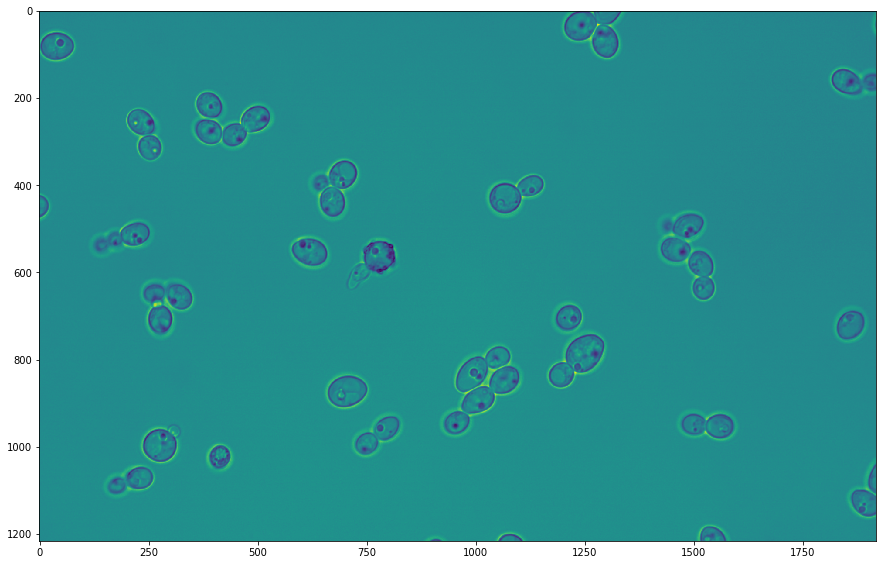

In [10]:
%matplotlib inline
for i in range(len(imRegs)):
    f = plt.figure(figsize = [15,15])
    plt.imshow(imRegs[i,0])
    plt.show()
    display.clear_output(wait=True)

In [11]:
%matplotlib inline
import pylab as pl
from IPython import display
for i in range(10):
    pl.clf()
    display.display(pl.gcf())

### Roberts  https://dsp.stackexchange.com/questions/898/roberts-edge-detector-how-to-use
from scipy import ndimage
import matplotlib.animation as animation

smooth_filter = twodgaussian(1.5,5)

roberts_cross_v = np.array( [[ 1, 0],
                             [ 0, -1]])

roberts_cross_h = np.array( [[ 0, 1],
                             [ -1, 0]])


plots = []
edge2 = None
for i in range(len(imRegs)-1):

    fig = plt.figure(figsize = [15,15])
    if edge2 is not None:
        edge1 = edge2
    else:
        smoothed = ndimage.convolve( imRegs[i,2], smooth_filter )
        vertical = ndimage.convolve( smoothed, roberts_cross_v )
        horizontal = ndimage.convolve( smoothed, roberts_cross_h )
        edge1 = np.sqrt( np.square(horizontal) + np.square(vertical))

    smoothed = ndimage.convolve( imRegs[i+1,2], smooth_filter )
    vertical = ndimage.convolve( smoothed, roberts_cross_v )
    horizontal = ndimage.convolve( smoothed, roberts_cross_h )
    edge2 = np.sqrt( np.square(horizontal) + np.square(vertical))
    
    normalized = (normalize(edge1*2-edge2*2)*255).astype(int)
    plot =plt.imshow(ndimage.convolve(normalized,smooth_filter))
    plt.show()
    display.clear_output(wait=True)
    time.sleep(0.001)

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [13]:
%matplotlib inline

### Roberts  https://dsp.stackexchange.com/questions/898/roberts-edge-detector-how-to-use
from scipy import ndimage
import matplotlib.animation as animation

smooth_filter = twodgaussian(1.5,5)

roberts_cross_v = np.array( [[ 1, 0],
                             [ 0, -1]])

roberts_cross_h = np.array( [[ 0, 1],
                             [ -1, 0]])




plots = []

#for i in range(5):
for i in range(0,len(imRegs)-1,1):
    fig = plt.figure(figsize = [15,15])
    smoothed = ndimage.convolve( imRegs[i], smooth_filter )
    vertical = ndimage.convolve( smoothed, roberts_cross_v )
    horizontal = ndimage.convolve( smoothed, roberts_cross_h )
    edge = np.sqrt( np.square(horizontal) + np.square(vertical))
    
    normalized = (normalize(edge)*255).astype(int)
    plot =plt.imshow(ndimage.convolve(normalized,smooth_filter))
    plots.append([plot])
    plt.show()
    #display.clear_output(wait=True)

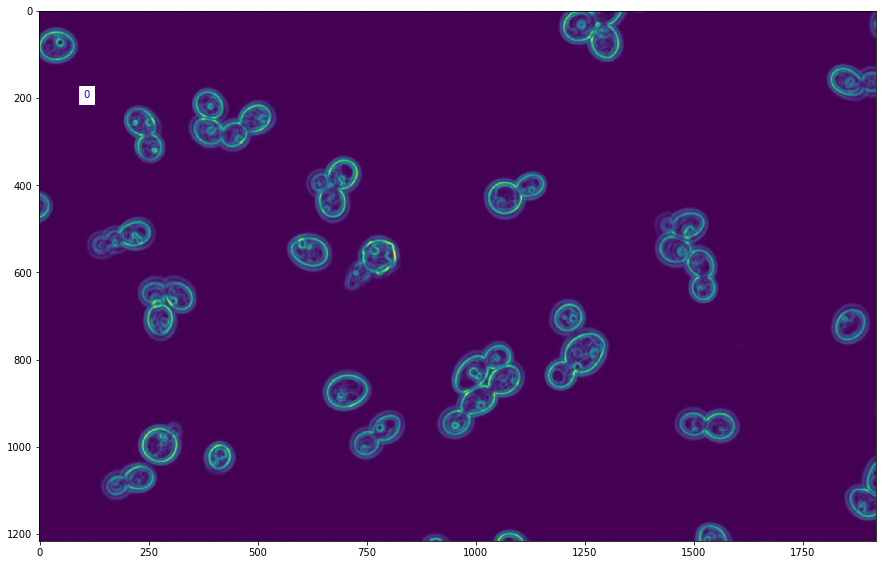

In [15]:
%matplotlib inline

### Roberts  https://dsp.stackexchange.com/questions/898/roberts-edge-detector-how-to-use
from scipy import ndimage
import matplotlib.animation as animation

smooth_filter = twodgaussian(2,5)
smooth_filter_2 = twodgaussian(1.5,5)

roberts_cross_v = np.array( [[ 1, 0],
                             [ 0, -1]])

roberts_cross_h = np.array( [[ 0, 1],
                             [ -1, 0]])


plots = []
stack = []

#for i in range(10):
for i in range(0,len(imRegs),1):
    fig = plt.figure(figsize = [15,15])
    smoothed = ndimage.convolve( normalize(imRegs[i,0]),smooth_filter)
    vertical = ndimage.convolve( smoothed, roberts_cross_v )
    horizontal = ndimage.convolve( smoothed, roberts_cross_h )
    edge = np.sqrt( np.square(horizontal) + np.square(vertical))
    
    normalized = (normalize(edge)*255).astype(int)
    plot =plt.imshow(ndimage.convolve(normalized,smooth_filter_2))
    stack.append(normalized)
    plt.text(100,200,str(i),backgroundcolor = 'w',color = 'b')
    #plot = plt.imshow(imRegs[i])
    plots.append([plot])
    plt.show()
    display.clear_output(wait=True)

In [16]:
len(stack)

1

In [284]:
cv2.isContourConvex(centroids[0])

error: OpenCV(3.4.2) C:\Miniconda3\conda-bld\opencv-suite_1534379934306\work\modules\imgproc\src\convhull.cpp:392: error: (-215:Assertion failed) total >= 0 && (depth == 5 || depth == 4) in function 'cv::isContourConvex'


In [294]:
sorted = np.sort([x for x in stats[:,4] if x > 1000])

In [296]:
np.mean(sorted[0:3])*1.5

5094.0

In [390]:
len((centroids[:,0]>50))

364

In [30]:
np.shape(imRegs[0,0])

(1216, 1920)

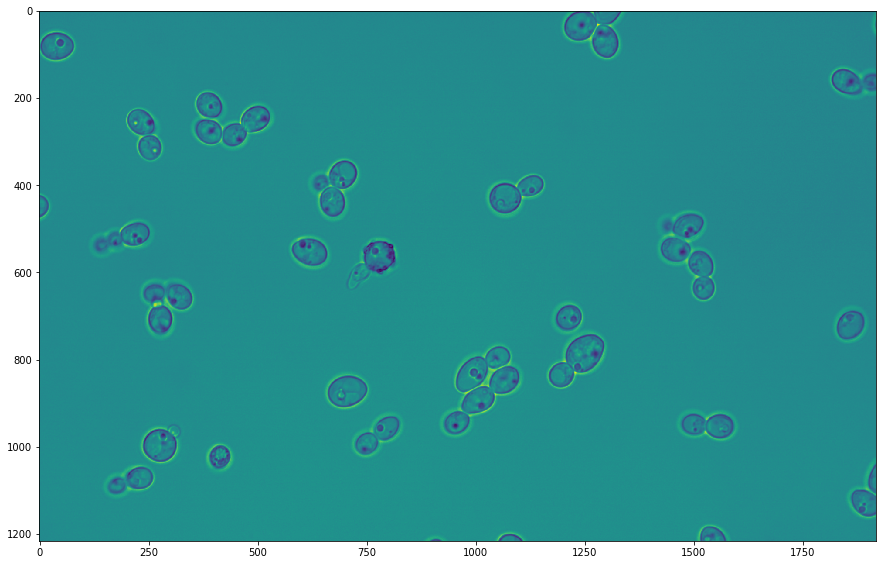

In [31]:
plt.figure(figsize = [15,15])
plt.imshow(imRegs[0,0])

In [36]:
img = imRegs[0,0]

In [37]:
img.dtype

dtype('float64')

In [38]:
img = img.astype('uint8')

opening:


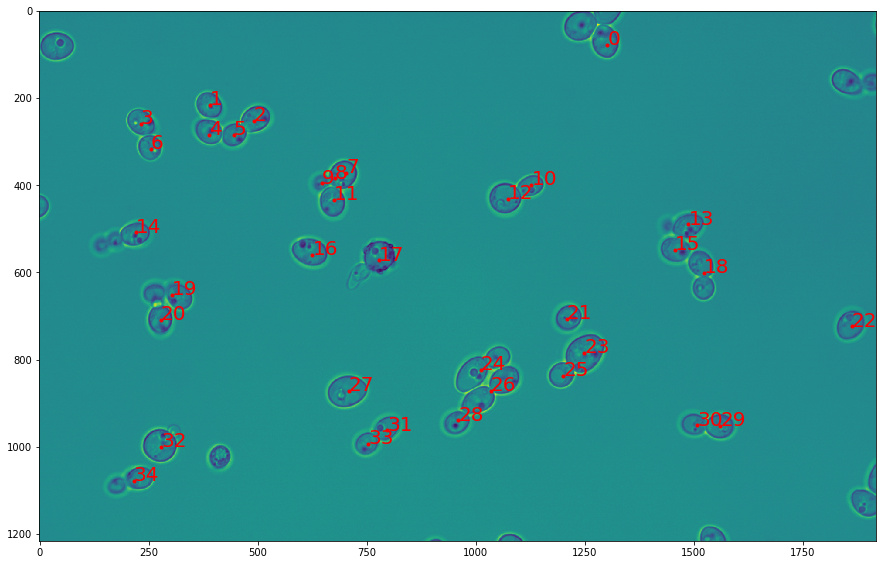

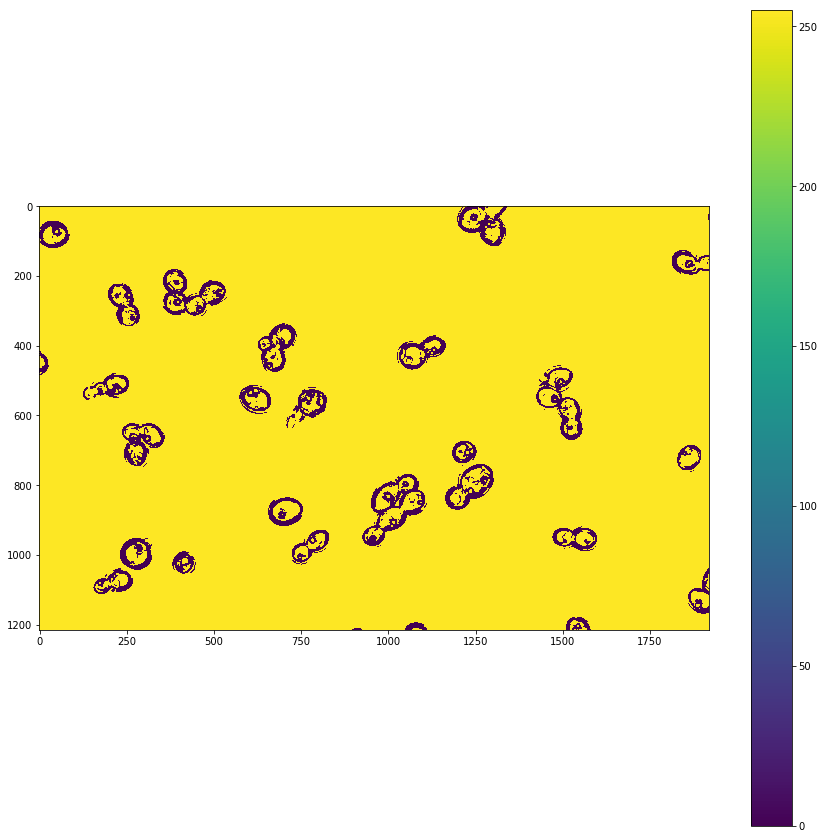

makers:


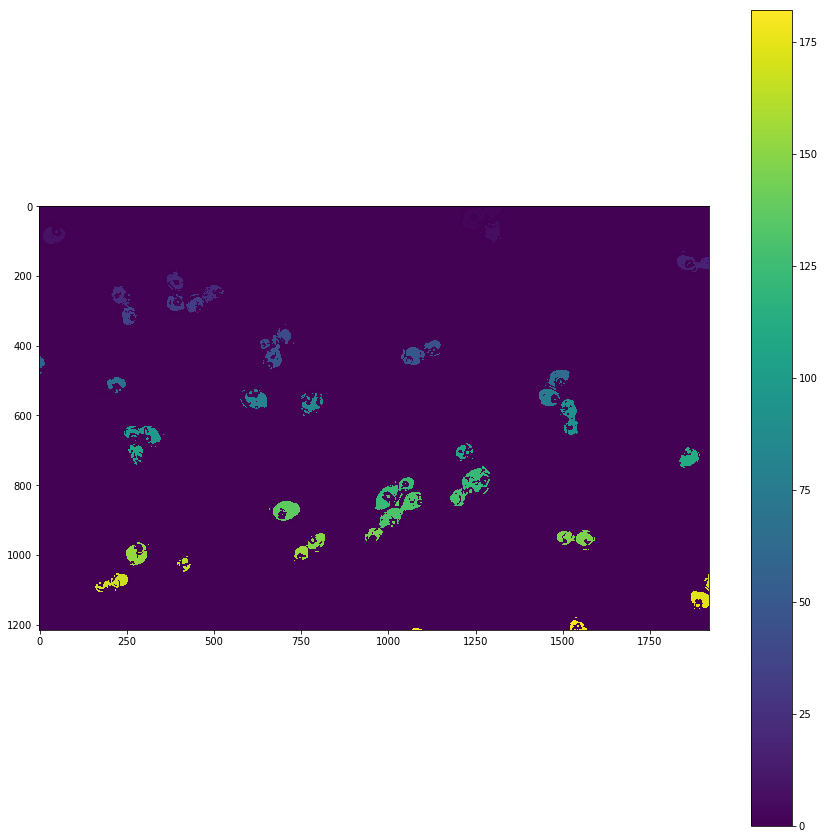

In [112]:
gray = img

### Roberts  https://dsp.stackexchange.com/questions/898/roberts-edge-detector-how-to-use
from scipy import ndimage
import matplotlib.animation as animation

smooth_filter = twodgaussian(2,5)
smooth_filter_2 = twodgaussian(1.5,5)

roberts_cross_v = np.array( [[ 1, 0],
                             [ 0, -1]])

roberts_cross_h = np.array( [[ 0, 1],
                             [ -1, 0]])


smoothed = ndimage.convolve( normalize(imRegs[i,0]),smooth_filter)
vertical = ndimage.convolve( smoothed, roberts_cross_v )
horizontal = ndimage.convolve( smoothed, roberts_cross_h )
edge = np.sqrt( np.square(horizontal) + np.square(vertical))
    
normalized = (normalize(edge)*255).astype('uint8')

ret, thresh = cv2.threshold(normalized,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
# noise removal
kernel = np.ones((2,2),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 2)

# Choose markers of area within a certain range
chosen = np.squeeze(np.where((stats[:,4]>300)* (stats[:,4]<threshold_single)  # something good to read https://stackoverflow.com/questions/33747908/output-of-numpy-wherecondition-is-not-an-array-but-a-tuple-of-arrays-why
                   *(centroids[:,0]>50)*(centroids[:,0]<field_w-50)
                   *(centroids[:,1]>50)*(centroids[:,1]<field_h-50)) )

if chosen.shape is not ():
    plt.figure(figsize = [15,15])
    # Add one to all labels so that sure background is not 0, but 1
    markers = markers+1

    #plt.imshow(markers.astype(np.uint8))
    plt.imshow(gray)
    #plt.imshow(imRegs[frame,0])
    for int, c in enumerate(centroids[chosen]):
        plt.text(c[0], c[1], str(int),fontsize = 20,color = 'r')

    centroids_current = centroids[chosen]
    [plt.plot(x[0],x[1],'r.') for x in centroids_current]


# Marker labelling
#ret, markers = cv2.connectedComponents(islands)

connectivity = 4  # You need to choose 4 or 8 for connectivity type  https://stackoverflow.com/questions/35854197/how-to-use-opencvs-connected-components-with-stats-in-python
num_markers, markers, stats, centroids = cv2.connectedComponentsWithStats(opening , connectivity , cv2.CV_16U+cv2.CC_STAT_AREA )


print('opening:')
plt.figure(figsize=[15,15])
plt.imshow(opening)
plt.colorbar()
plt.show()

print('makers:')
plt.figure(figsize=[15,15])
plt.imshow(markers)
plt.colorbar()
plt.show()

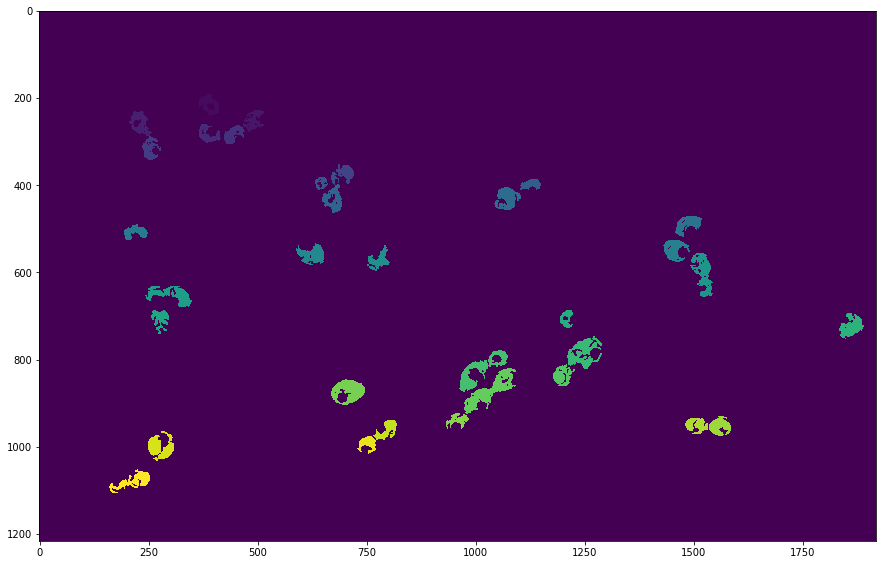

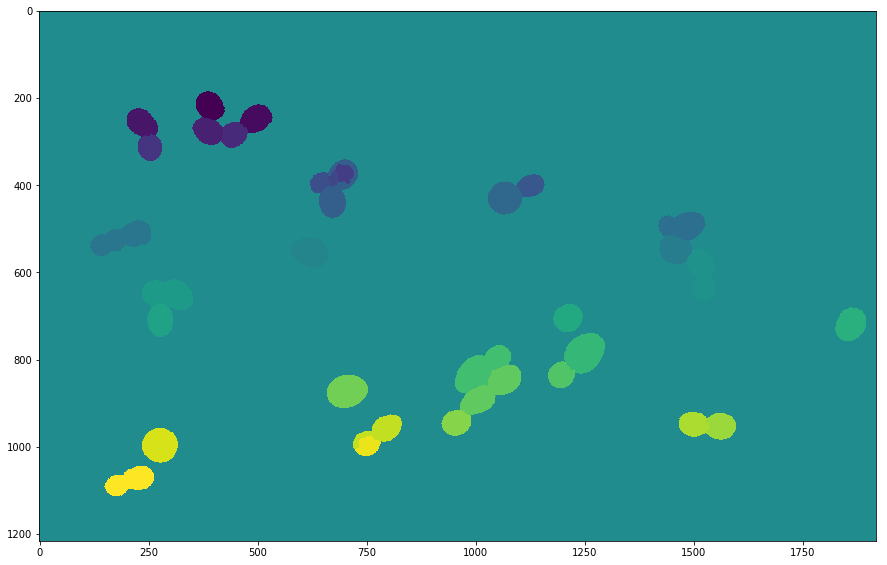

In [129]:
nummask = np.zeros(np.shape(markers))
for ide, cell in enumerate(chosen):
    nummask[markers == cell] = ide
nummask = nummask.astype('uint8')
plt.figure(figsize = [15,15])
plt.imshow(nummask)

from skimage.morphology import watershed
# Now, mark the region of unknown with zero

watershed = watershed(img,nummask)
#img[watershed == -1] = [255,0,0]
plt.figure(figsize=[15,15])
plt.imshow(watershed)



In [131]:
np.max(watershed)

34

In [132]:
np.max(nummask)

34

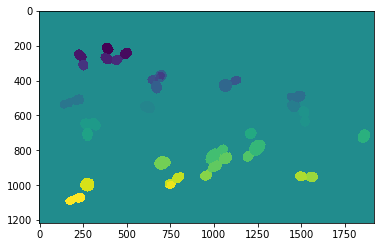

gray


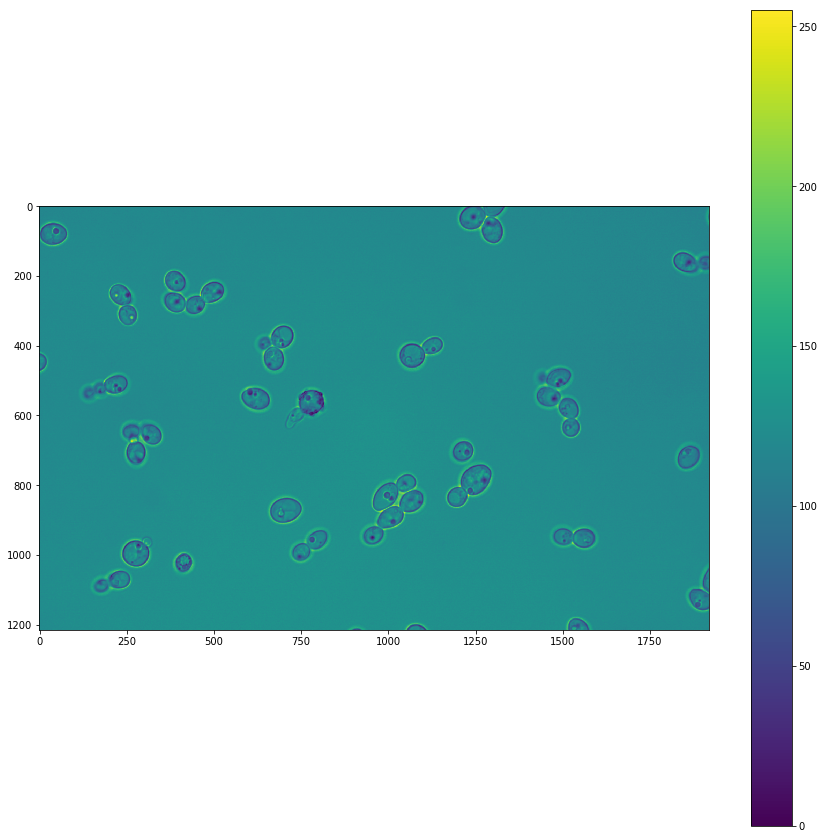

threshold


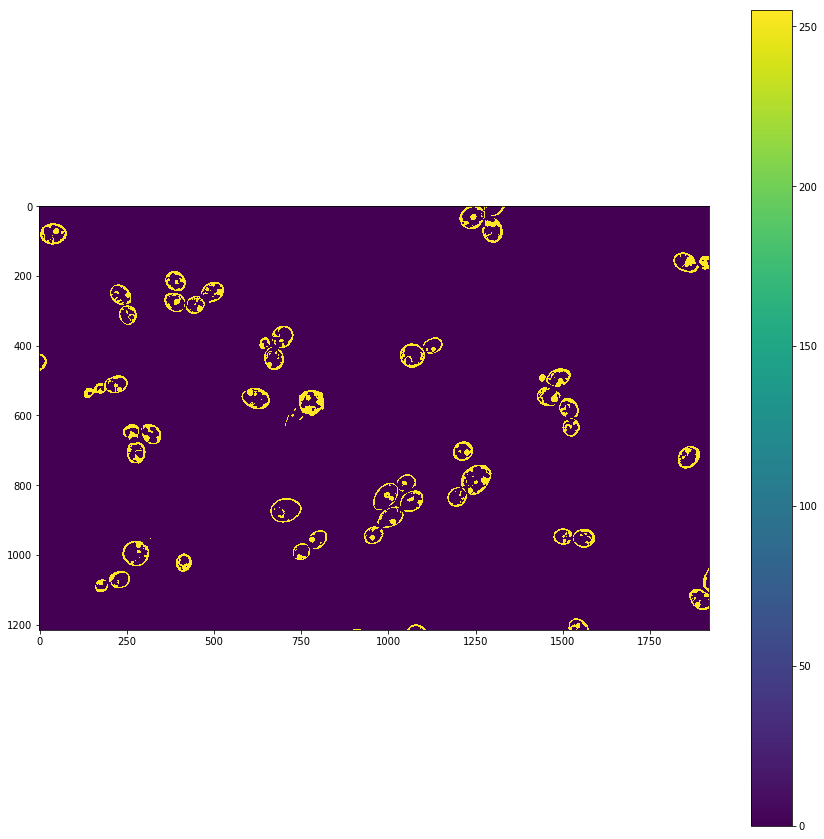

opening:


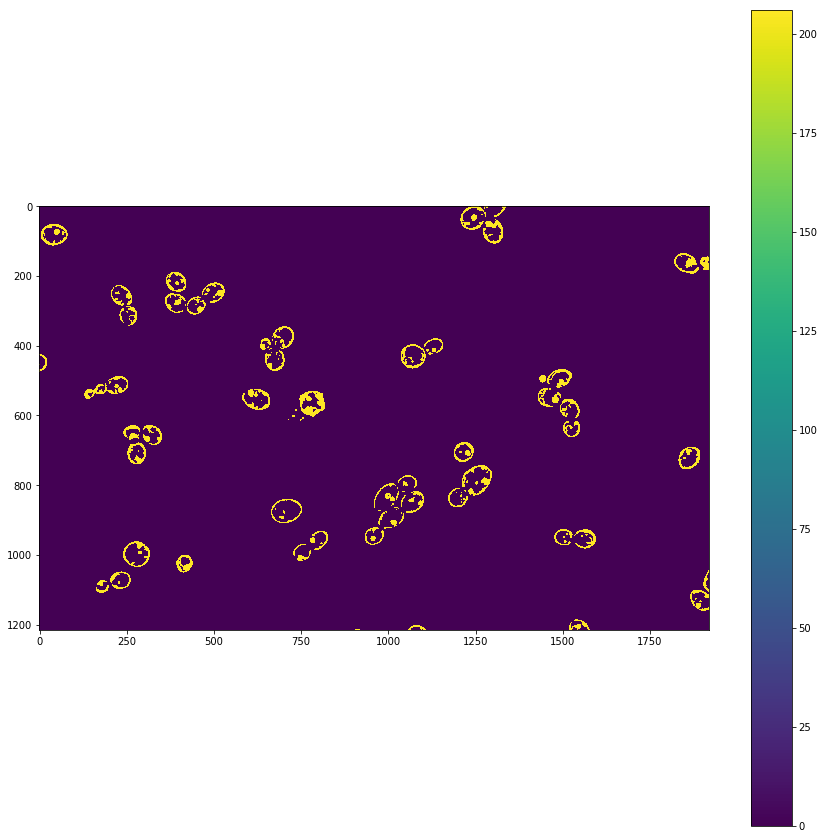

sure_bg:


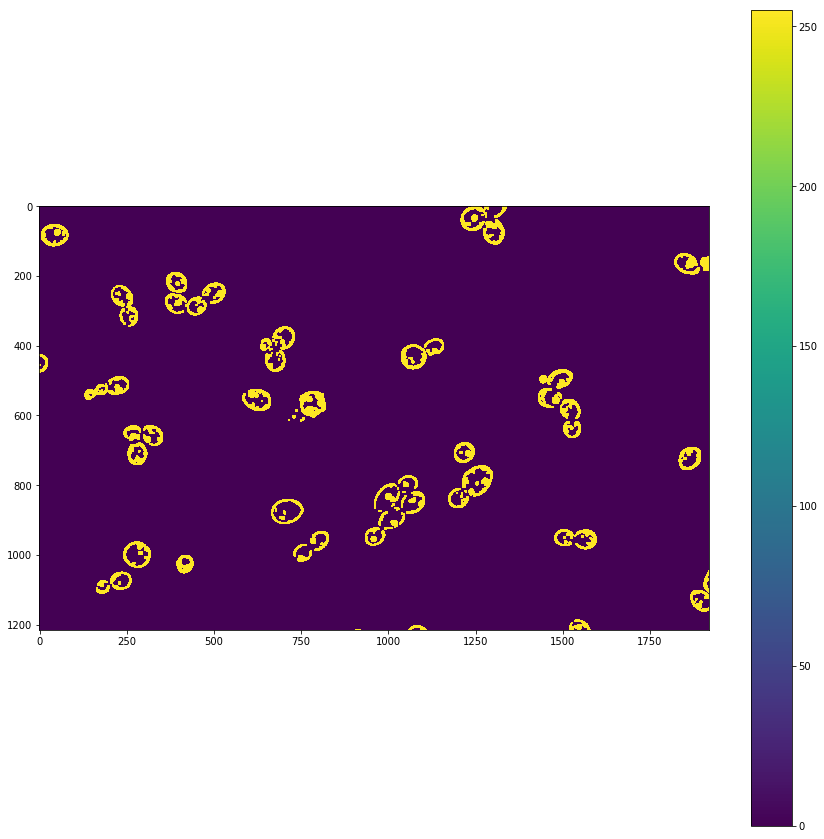

sure_fg:


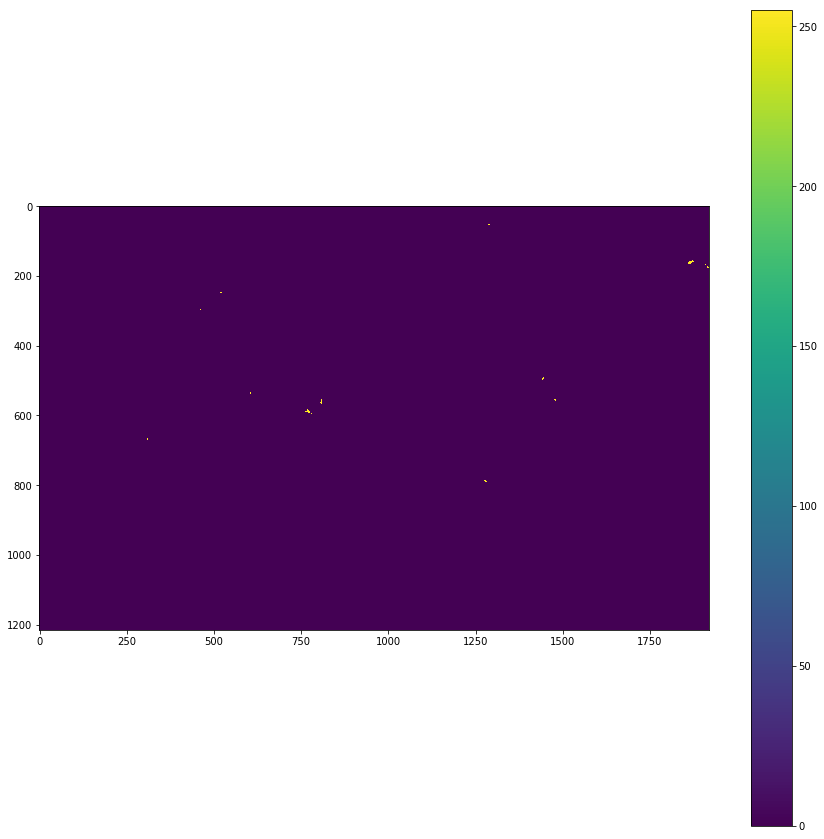

In [72]:
gray = img

ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
# noise removal
kernel = np.ones((2,2),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 2)


# sure background area
sure_bg = cv2.dilate(opening,kernel,iterations=3)

# Finding sure foreground area
dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
ret, sure_fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)

# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)

print('gray')
plt.figure(figsize=[15,15])
plt.imshow(gray)
plt.colorbar()
plt.show()

print('threshold')
plt.figure(figsize=[15,15])
plt.imshow(thresh)
plt.colorbar()
plt.show()

print('opening:')
plt.figure(figsize=[15,15])
plt.imshow(50*opening)
plt.colorbar()
plt.show()

print('sure_bg:')
plt.figure(figsize=[15,15])
plt.imshow(sure_bg)
plt.colorbar()
plt.show()

print('sure_fg:')
plt.figure(figsize=[15,15])
plt.imshow(sure_fg)
plt.colorbar()
plt.show()

In [ ]:

# noise removal
kernel = np.ones((3,3),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 2)

# sure background area
sure_bg = cv2.dilate(opening,kernel,iterations=3)

# Finding sure foreground area
dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
ret, sure_fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)

# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)

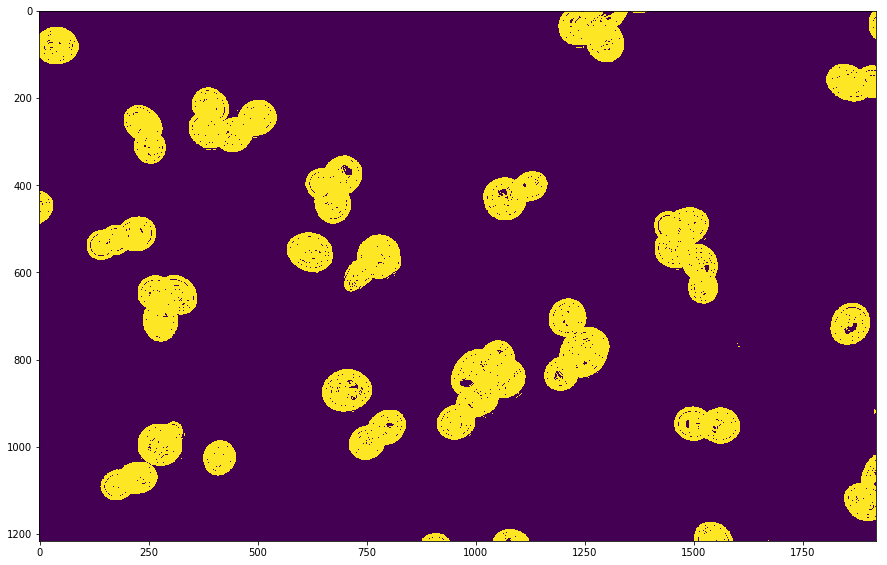

[]


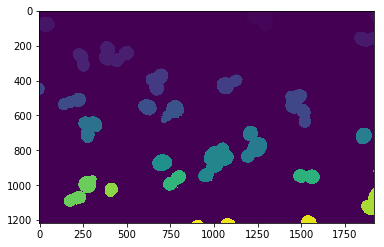

0


In [19]:
#frames = range(5)
frames = range(len(stack))
ax = fig.add_subplot(111)
cellsummary = np.empty((0,4), int) #picture, GFP, RFP, area


for ind, frame in enumerate(frames):
    fig = plt.figure(figsize = [15,15]) 
    # Copy the thresholded image. https://docs.opencv.org/3.1.0/d3/db4/tutorial_py_watershed.html
    im_th = np.array(normalize(stack[frame])*255>5).astype(int)
    im_floodfill = im_th
    plt.imshow(im_th)
    plt.show()
    # Mask used to flood filling.
    # Notice the size needs to be 2 pixels than the image.
    h, w = im_th.shape[:2]
    mask = np.zeros((h+2, w+2), np.uint8)

    # Floodfill from point (0, 0)
    cv2.floodFill(im_floodfill, mask, (2,2), 255); # seed it from somewhere other than the edge...sometimes the edges have wired values

    # Invert floodfilled image
    islands = cv2.bitwise_not(im_floodfill).astype(np.uint8)
    
    # Marker labelling
    #ret, markers = cv2.connectedComponents(islands)

    connectivity = 4  # You need to choose 4 or 8 for connectivity type  https://stackoverflow.com/questions/35854197/how-to-use-opencvs-connected-components-with-stats-in-python
    num_markers, markers, stats, centroids = cv2.connectedComponentsWithStats(islands , connectivity , cv2.CV_16U+cv2.CC_STAT_AREA )
    
    # set upper limit for single cell
    sorted = np.sort([x for x in stats[:,4] if x > 1000])
    if len(sorted) > 5:
        threshold_single = np.median(sorted[0:5])*1.5
    else:
        threshold_single = 15000
        
    # Choose markers of area within a certain range
    chosen = np.squeeze(np.where((stats[:,4]>1000)* (stats[:,4]<threshold_single)  # something good to read https://stackoverflow.com/questions/33747908/output-of-numpy-wherecondition-is-not-an-array-but-a-tuple-of-arrays-why
                       *(centroids[:,0]>50)*(centroids[:,0]<field_w-50)
                       *(centroids[:,1]>50)*(centroids[:,1]<field_h-50)) )
    print(chosen)
    if chosen.shape is not ():
        # Add one to all labels so that sure background is not 0, but 1
        markers = markers+1

        plt.imshow(markers.astype(np.uint8))
        #plt.imshow(imRegs[frame,0])
        #for c in centroids[chosen]:
        #    plt.text(c[0], c[1], str(c))

        centroids_current = centroids[chosen]
        [plt.plot(x[0],x[1],'r.') for x in centroids_current]
        #print(frame,num_markers,stats)

        # show the image
        plt.show()
        #time.sleep(3)
        #display.clear_output(wait=True)

        # calculate the sum of intensity in other channels
    
        for cell in chosen:
            singlecellmask = np.squeeze(np.array([markers == cell+1]).astype(int))
            singlecellGFP = np.sum(imRegs[frame,0] * singlecellmask).astype(int)
            singlecellRFP = np.sum(imRegs[frame,1] * singlecellmask).astype(int)
            summary_current_cell = [frame,singlecellGFP,singlecellRFP, stats[cell, 4]]
            #print(summary_current_cell)
            cellsummary = np.append(cellsummary,[summary_current_cell],axis = 0)
    print(frame)
    #plt.hist(stats[chosen,3])
    #plt.xlim(0,255)
    #plt.show()
    #display.clear_output(wait=True)

#outfile = open('090119.npy','wb')
#np.save(outfile,cellsummary)
        

In [386]:
centroids.astype(int)

array([[ 963,  604],
       [ 815,   23],
       [ 998,    2],
       [1018,    1],
       [1072,    3],
       [1274,   67],
       [ 783,   48],
       [ 825,   55],
       [ 797,   60],
       [ 803,   61],
       [ 812,   60],
       [1581,  170],
       [1235,  107],
       [1243,  114],
       [1095,  183],
       [1545,  171],
       [1066,  211],
       [1553,  221],
       [ 792,  242],
       [1582,  231],
       [1588,  230],
       [ 752,  271],
       [ 168,  303],
       [ 794,  289],
       [ 118,  305],
       [ 577,  354],
       [ 552,  322],
       [ 518,  375],
       [ 608,  384],
       [ 592,  389],
       [ 552,  398],
       [ 318,  473],
       [ 139,  563],
       [ 292,  514],
       [1786,  596],
       [  60,  569],
       [   6,  587],
       [  79,  588],
       [1730,  589],
       [1731,  592],
       [1733,  596],
       [1742,  609],
       [ 367,  689],
       [ 179,  621],
       [   2,  622],
       [ 386,  710],
       [1028,  773],
       [ 773,

In [384]:
field_w

1920

(array([1., 0., 0., 3., 3., 2., 0., 1., 1., 1.]),
 array([ 57. ,  63.7,  70.4,  77.1,  83.8,  90.5,  97.2, 103.9, 110.6,
        117.3, 124. ]),
 <a list of 10 Patch objects>)

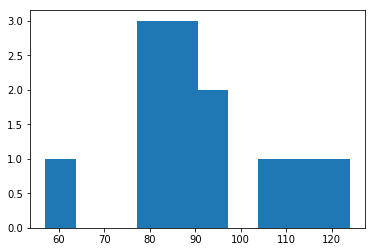

In [366]:
plt.hist(stats[chosen,3])

In [367]:
np.shape(cellsummary)

(876, 4)

In [368]:
chosen.shape == ()

False

(0, 20000)

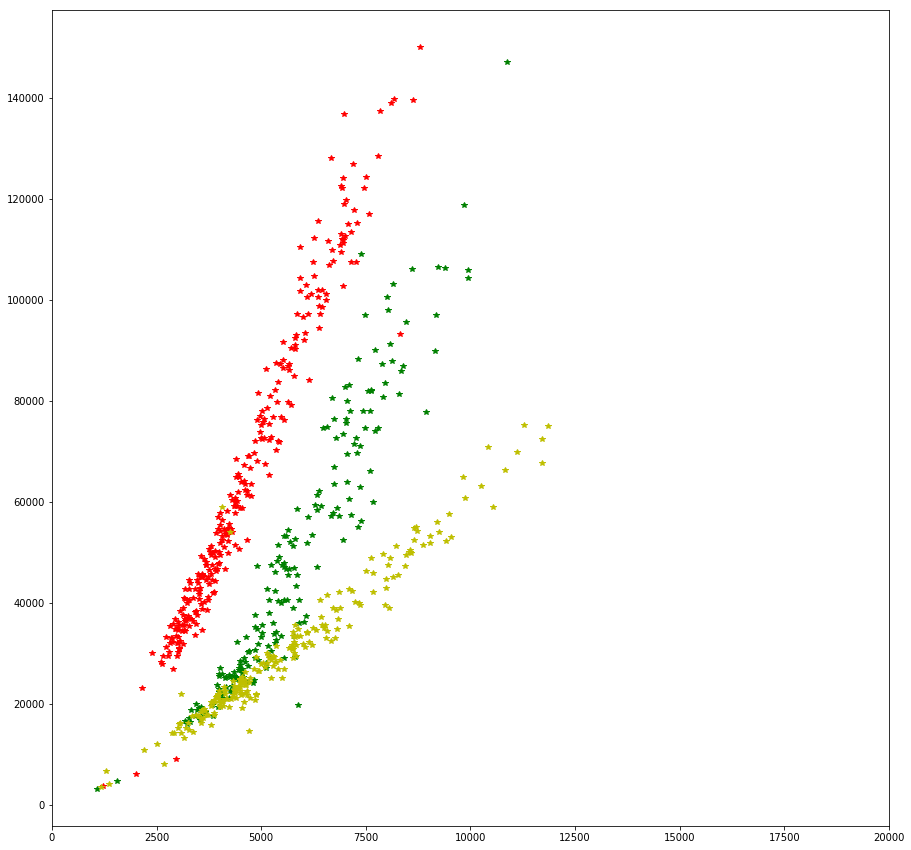

In [393]:
#picture, GFP, RFP, area
GFP = 1
RFP = 2
area = 3

CLN3 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(32)]
HTA2 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(32,63)]
WHI3 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(63,96)]
plt.figure(figsize = [15,15])
plt.plot(cellsummary[CLN3,area],cellsummary[CLN3,GFP],'g*')
plt.plot(cellsummary[WHI3,area],cellsummary[WHI3,GFP],'r*')
plt.plot(cellsummary[HTA2,area],cellsummary[HTA2,GFP],'y*')
plt.xlim(0,20000)
#plt.ylim(0,20)

-1.9037299052671777e-06
-0.12533076236765003


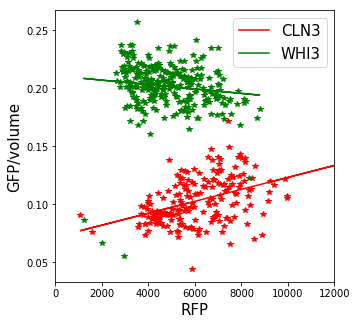

In [423]:
from scipy.stats import linregress
#picture, GFP, RFP, area
GFP = 1
RFP = 2
area = 3
CLN3 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(32)]
HTA2 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(32,63)]
WHI3 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(63,96)]
plt.figure(figsize = [5,5])
x = cellsummary[CLN3,RFP]
y = cellsummary[CLN3,GFP]/cellsummary[CLN3,area]**(3/2)
slope, intercept, r_value, p_value, std_err = linregress(x,y)
line = slope*x+intercept
cln3 = plt.plot(x,y,'r*')
plt.plot( x, line,'r',label = "CLN3")


#[print(str([x,y]) + ';') for x, y in zip(x,y)]

x=0
y=0
x = cellsummary[WHI3,RFP]
y = cellsummary[WHI3,GFP]/cellsummary[WHI3,area]**(3/2)
slope, intercept, r_value, p_value, std_err = linregress(x,y)
line = slope*x+intercept
whi3 = plt.plot(x,y,'g*')
plt.plot(x , line,'g',label = "WHI3")

print(slope)
print(r_value)
#plt.plot(cellsummary[HTA2,3],cellsummary[HTA2,2],'y*')
plt.xlim(0,12000)
#[print(str([x,y]) + ';') for x, y in zip(x,y)]

plt.xlabel("RFP",size = 15)
plt.ylabel("GFP/volume", size = 15)
plt.legend(fontsize = 15)





In [382]:
[[i,j] for i, j in zip(x,y)][:]

[[5583, 0.26317168970614885],
 [3149, 0.2189601949760582],
 [3668, 0.2051015389504918],
 [5777, 0.19052403656943326],
 [4775, 0.1893454700081581],
 [4103, 0.20818852821503905],
 [5298, 0.18799192170293716],
 [5106, 0.1955125567308672],
 [3505, 0.18226760258815208],
 [5197, 0.17819146353936627],
 [2855, 0.21806526096435483],
 [5721, 0.20075175826705732],
 [5194, 0.21228897904047161],
 [3763, 0.20037994053513516],
 [3009, 0.18314307382222886],
 [4081, 0.19184077468636274],
 [4178, 0.1940527411513825],
 [3866, 0.17760225664611495],
 [5044, 0.17624083733716284],
 [1731, 0.3325481123075776],
 [4307, 0.18148179000318582],
 [5178, 0.19372217564833435],
 [3418, 0.20065619760615408],
 [2998, 0.1864246917820037],
 [3686, 0.18296829958913907],
 [2497, 0.23323153171410027],
 [8099, 0.18722604057344713],
 [6695, 0.17803740571287852],
 [5640, 0.19093346909678982],
 [3864, 0.2090265171835288],
 [5575, 0.20985115472625562],
 [4687, 0.19216184426399455],
 [4614, 0.20855358580209804],
 [2919, 0.21421802

-1.2393743715947289e-08
-0.08811793142541383


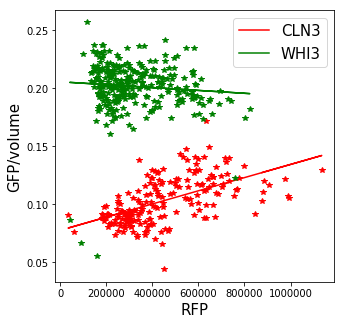

In [427]:
from scipy.stats import linregress
#picture, GFP, RFP, area
GFP = 1
RFP = 2
area = 3
CLN3 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(32)]
HTA2 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(32,63)]
WHI3 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(63,96)]
plt.figure(figsize = [5,5])
x = cellsummary[CLN3,area]**(3/2)
y = cellsummary[CLN3,GFP]/cellsummary[CLN3,area]**(3/2)
slope, intercept, r_value, p_value, std_err = linregress(x,y)
line = slope*x+intercept
cln3 = plt.plot(x,y,'r*')
plt.plot( x, line,'r',label = "CLN3")


#[print(str([x,y]) + ';') for x, y in zip(x,y)]

x=0
y=0
x = cellsummary[WHI3,area]**(3/2)
y = cellsummary[WHI3,GFP]/cellsummary[WHI3,area]**(3/2)
slope, intercept, r_value, p_value, std_err = linregress(x,y)
line = slope*x+intercept
whi3 = plt.plot(x,y,'g*')
plt.plot(x , line,'g',label = "WHI3")

print(slope)
print(r_value)
#plt.plot(cellsummary[HTA2,3],cellsummary[HTA2,2],'y*')
#plt.xlim(0,12000)
#[print(str([x,y]) + ';') for x, y in zip(x,y)]

plt.xlabel("RFP",size = 15)
plt.ylabel("GFP/volume", size = 15)
plt.legend(fontsize = 15)





18.863940246999864
0.8980168990355978
0.8304493473524709
0.5182632497340879


(0, 12000)

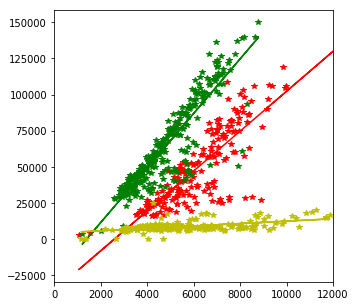

In [430]:
from scipy.stats import linregress
#picture, GFP, RFP, area
GFP = 1
RFP = 2
area = 3
CLN3 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(32)]
HTA2 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(32,63)]
WHI3 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(63,96)]
plt.figure(figsize = [5,5])
x = cellsummary[CLN3,RFP]
y = cellsummary[CLN3,GFP]#/cellsummary[CLN3,area]**(3/2)
slope, intercept, r_value, p_value, std_err = linregress(x,y)
line = slope*x+intercept
cln3 = plt.plot(x,y,'r*')
plt.plot( x, line,'r',label = "CLN3")


#[print(str([x,y]) + ';') for x, y in zip(x,y)]

x=0
y=0
x = cellsummary[WHI3,RFP]
y = cellsummary[WHI3,GFP]#/cellsummary[WHI3,area]**(3/2)
slope, intercept, r_value, p_value, std_err = linregress(x,y)
line = slope*x+intercept
whi3 = plt.plot(x,y,'g*')
plt.plot(x , line,'g',label = "WHI3")

print(slope)
print(r_value)
#plt.plot(cellsummary[HTA2,3],cellsummary[HTA2,2],'y*')
plt.xlim(0,12000)
#[print(str([x,y]) + ';') for x, y in zip(x,y)]



x=0
y=0
x = cellsummary[HTA2,area]
y = cellsummary[HTA2,RFP]#/cellsummary[HTA2,area]**(3/2)
slope, intercept, r_value, p_value, std_err = linregress(x,y)
line = slope*x+intercept
Hta2 = plt.plot(x,y,'y*')
plt.plot(x , line,'y',label = "HTA2")

print(slope)
print(r_value)
#plt.plot(cellsummary[HTA2,3],cellsummary[HTA2,2],'y*')
plt.xlim(0,12000)
#[print(str([x,y]) + ';') for x, y in zip(x,y)]


In [363]:
np.sort(cellsummary[WHI3,area])

IndexError: index 535 is out of bounds for axis 0 with size 0

In [279]:
#picture, GFP, RFP, area
GFP = 1
RFP = 2
area = 3
CLN3 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(32)]
HTA2 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(32,63)]
WHI3 = [i for i, ind in enumerate(cellsummary[:,0]) if ind in range(63,96)]
plt.figure(figsize = [15,15])
plt.plot(cellsummary[CLN3,RFP],cellsummary[CLN3,GFP]/cellsummary[CLN3,RFP],color = 1)
#plt.plot(cellsummary[WHI3,RFP],cellsummary[WHI3,GFP]/cellsummary[WHI3,RFP],'r*')
#plt.plot(cellsummary[HTA2,3],cellsummary[HTA2,2],'y*')
plt.xlim(0,20000)

(0, 20000)

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x000002D9756C0F28> (for post_execute):


ValueError: Invalid RGBA argument: 1

ValueError: Invalid RGBA argument: 1

<Figure size 1080x1080 with 1 Axes>

In [247]:
frame

77

In [198]:
a = np.append(np.empty((0,4), int),[framesummary],axis = 0)
print(a)

[[   9. 3957. 1325. 1325.]]


In [108]:
[i for i in stats[chosen]]


[array([ 998,  107,   77,  124, 7124], dtype=int32),
 array([ 693,  120,   92,   81, 5067], dtype=int32),
 array([  93,  255,  124,  105, 7048], dtype=int32),
 array([ 776,  256,   81,   68, 4158], dtype=int32),
 array([ 1088,   323,   127,   158, 11746], dtype=int32),
 array([1881,  398,   39,   70, 2066], dtype=int32),
 array([ 662,  464,   85,   77, 4144], dtype=int32),
 array([1052,  509,  128,  107, 7907], dtype=int32),
 array([1890,  608,   30,   80, 1618], dtype=int32),
 array([ 237,  649,  149,   77, 7733], dtype=int32),
 array([ 1102,   699,   140,   115, 10697], dtype=int32),
 array([ 474,  844,  133,   72, 6837], dtype=int32),
 array([ 1390,   905,   113,   157, 10649], dtype=int32),
 array([1611,  945,   92,   76, 4987], dtype=int32),
 array([1794, 1040,   78,  101, 5128], dtype=int32),
 array([1200, 1137,   49,   40, 1325], dtype=int32)]

In [109]:
np.squeeze(imRegs[9,0]*[islands == 1])

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [137]:
chosen

array([  62,   69,  173,  181,  282,  431,  539,  604,  749,  767,  810,
        902,  945,  977, 1049, 1213], dtype=int64)

In [129]:
np.max([i for i in np.array([markers == 62]).astype(int)])

1

In [154]:
for cell in chosen:
    singlecellmask = np.squeeze(np.array([markers == cell+1]).astype(int))
    singlecellGFP = np.sum(imRegs[frame,0] * singlecellmask)
    singlecellRFP = np.sum(imRegs[frame,1] * singlecellmask)
    print([singlecellGFP,singlecellRFP])

[58121.0, 7860.0]
[35044.0, 6115.0]
[43247.0, 7393.0]
[28587.0, 4160.0]
[81339.0, 15825.0]
[10062.0, 2066.0]
[23948.0, 4200.0]
[52603.0, 10571.0]
[7053.0, 1618.0]
[45820.0, 7778.0]
[72777.0, 12352.0]
[43766.0, 7943.0]
[73117.0, 12701.0]
[33591.0, 5084.0]
[26130.0, 5141.0]
[3957.0, 1325.0]


In [152]:
sum([i for i in sum(imRegs[9,1] * np.squeeze(np.array([markers == chosen[1]+1]).astype(int)))])

6115.0

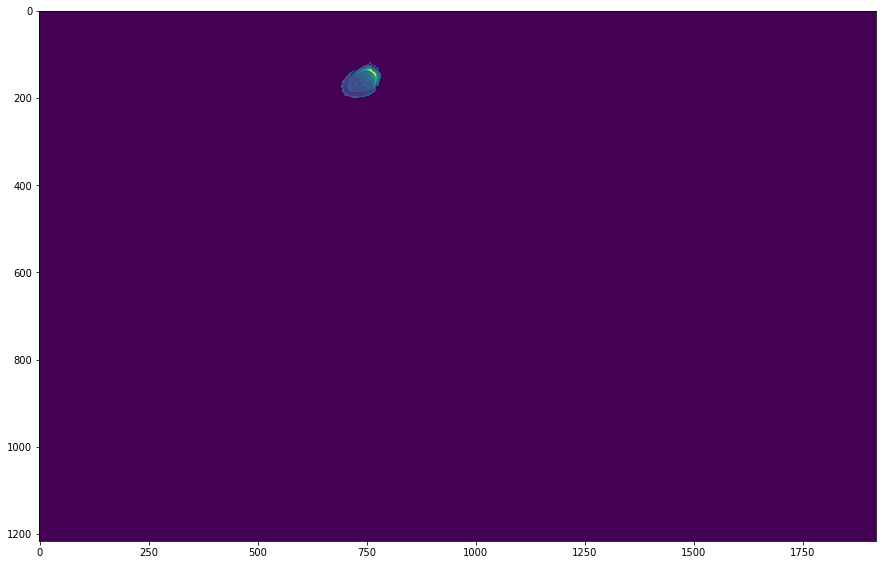

In [143]:
plt.figure(figsize = [15,15])
plt.imshow(imRegs[9,1] * np.squeeze(np.array([markers == chosen[1]+1]).astype(int)))
plt.show()

In [20]:
outfile = open('071719.npy','wb')
np.save(outfile, stack)

In [7]:
infile = open('071719.npy','rb')
stack = np.load(infile)

In [486]:
np.shape(stack)

(596, 1024, 1024)

In [ ]:
plt.figure(figsize = [15,15])
plt.imshow(stack[5]>10)
plt.show()

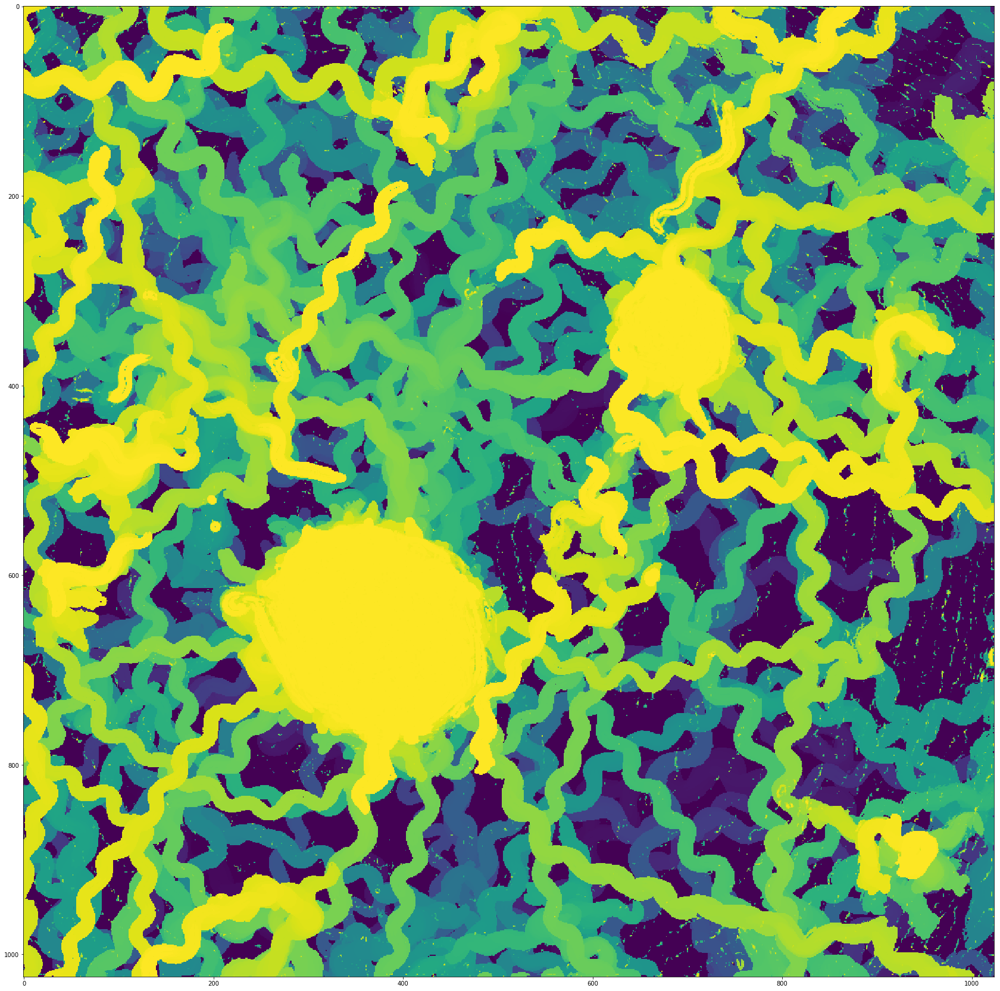

In [11]:
time_series = ((np.array(stack)>10).astype(int).T*range(np.shape(stack)[0])).T   #colored stack
plt.figure(figsize = [30,30])
stacking = np.amax(time_series,axis = 0)
plt.imshow(stacking, vmax = len(time_series))
plt.show()


In [487]:
def closest_node(node, nodes):      #https://codereview.stackexchange.com/questions/28207/finding-the-closest-point-to-a-list-of-points
    nodes = np.asarray(nodes)
    deltas = nodes - node
    dist = np.einsum('ij,ij->i', deltas, deltas)
    return  node, nodes[np.argmin(dist)], np.round(dist[np.argmin(dist)]**(1/2))


dot = np.tensordot(((np.array(stack)>30).astype(int)),range(np.shape(stack)[0]),axes = ([0],[0]))

frames = range(600-5)
colormap = plt.cm.jet #nipy_spectral, Set1,Paired   
colors = [colormap(i) for i in np.linspace(0, 1,len(frames))]


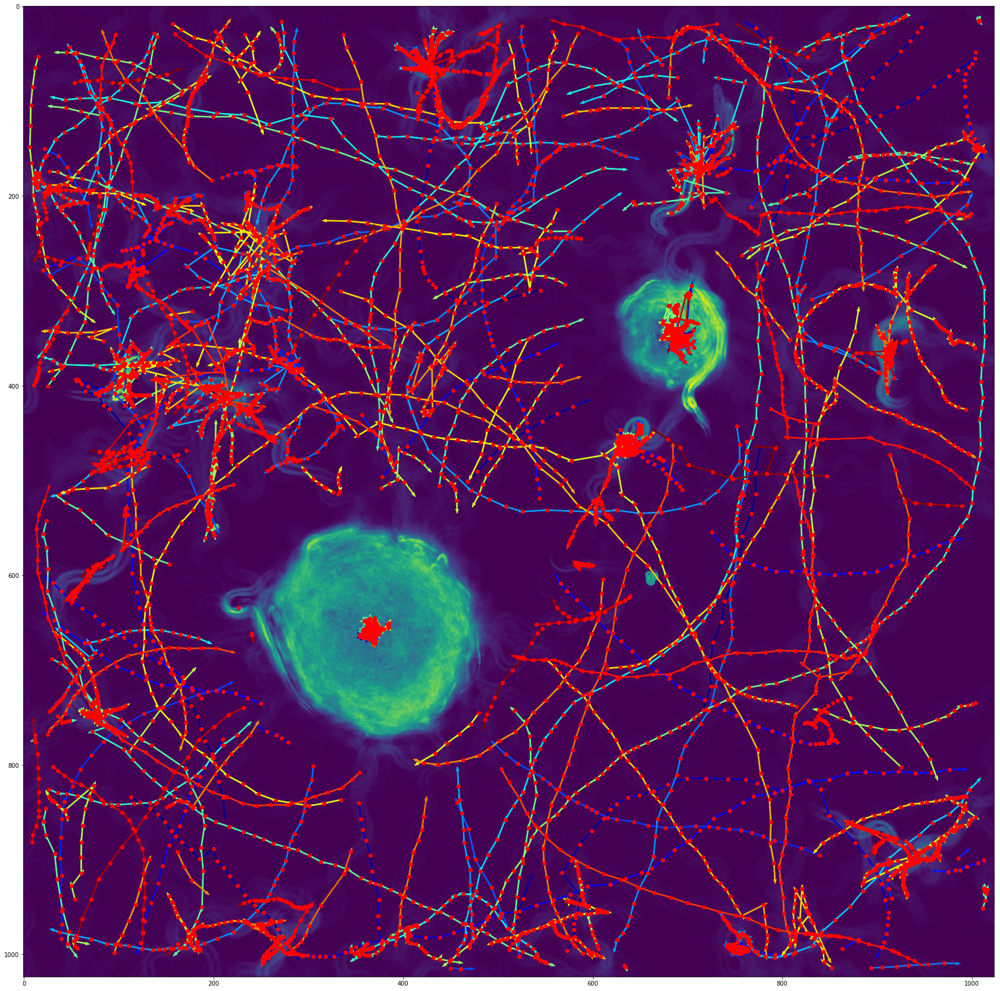

In [489]:
#frames = range(10,20)
fig = plt.figure(figsize = [30,30]) 
plt.imshow(dot, vmax = np.shape(stack)[0])
#plt.imshow(np.zeros(np.shape(dot)))
plt.imshow(dot)

ax = fig.add_subplot(111)
arrows = []
centroids_last_frame = None
collect_x = []
collect_y = []
collect_dx = []
collect_dy = []
for ind, frame in enumerate(frames):
    #fig = plt.figure(figsize = [5,5]) 
    # Copy the thresholded image. https://docs.opencv.org/3.1.0/d3/db4/tutorial_py_watershed.html
    im_th = np.array(normalize(stack[frame])*255>10).astype(int)
    im_floodfill = im_th
    #plt.imshow(im_th)
    #plt.show()
    # Mask used to flood filling.
    # Notice the size needs to be 2 pixels than the image.
    h, w = im_th.shape[:2]
    mask = np.zeros((h+2, w+2), np.uint8)

    # Floodfill from point (0, 0)
    cv2.floodFill(im_floodfill, mask, (5,5), 255); # seed it from somewhere other than the edge...sometimes the edges have wired values

    # Invert floodfilled image
    islands = cv2.bitwise_not(im_floodfill).astype(np.uint8)
    
    # Marker labelling
    #ret, markers = cv2.connectedComponents(islands)

    connectivity = 4  # You need to choose 4 or 8 for connectivity type  https://stackoverflow.com/questions/35854197/how-to-use-opencvs-connected-components-with-stats-in-python
    num_markers, markers, stats, centroids = cv2.connectedComponentsWithStats(islands , connectivity , cv2.CV_16U+cv2.CC_STAT_AREA )

    # Choose markers of area within a certain range
    chosen = np.where((stats[:,4]>1000)* (stats[:,4]<100000))  # something good to read https://stackoverflow.com/questions/33747908/output-of-numpy-wherecondition-is-not-an-array-but-a-tuple-of-arrays-why

    # Add one to all labels so that sure background is not 0, but 1
    markers = markers+1

    #plt.imshow(markers.astype(np.uint8))
   
    #for c in centroids[chosen]:
    #    plt.text(c[0], c[1], str(c))

    centroids_current = centroids[chosen]
    #[plt.plot(x[0],x[1],'b.') for x in centroids_current]
    #print(frame,num_markers,stats)
    if (centroids_last_frame is not None):
        if len(centroids_last_frame) is not 0:
            
            mapping = [closest_node(c , centroids_last_frame) for c in centroids_current]
            #mapping = mapping[np.where((mapping[:,4]<150))]
            for i in range(len(mapping)):
                distance = mapping[i][2]
                x = mapping[i][1][0]   #last frame
                y = mapping[i][1][1]
                dx = mapping[i][0][0] - mapping[i][1][0]
                dy = mapping[i][0][1] - mapping[i][1][1]
                ax.plot(x,y,'ro')
                #plt.plot(x+dx,y+dy,'r.')
                
                if (distance < 50):# & (num_markers <20):
                    arrow = ax.arrow(x,y,dx,dy,width = 1,shape = 'full',color = colors[ind])
                    arrows.append([arrow])
                    #t=ax.text(x,y,str(distance))
                    #t.set_bbox(dict(facecolor='white', alpha=0.5, edgecolor= 'white'))
                    collect_x.append(x)
                    collect_y.append(y)
                    collect_dx.append(dx)
                    collect_dy.append(dy)
            
    centroids_last_frame = centroids_current
    # show the image
    #plt.show()
plt.show()
display.clear_output(wait=True)

In [499]:
num_bins = 20
bin_size = h/num_bins
vf_loc = np.reshape([(i, j) for i in range(num_bins) for j in range(num_bins)],(num_bins,num_bins,2))*bin_size + 0.5* bin_size
vf_vec = np.zeros((num_bins,num_bins,2))
vf_count = vf_vec.copy()
for i in range(len(collect_x)):
    vf_vec[int(collect_y[i]/bin_size), int(collect_x[i]/bin_size)][:] += [collect_dy[i], collect_dx[i]] 
    vf_count[int(collect_y[i]/bin_size), int(collect_x[i]/bin_size)][:] += 1
vf_vec = np.divide(vf_vec,vf_count,out=np.zeros_like(vf_vec), where=vf_count!=0)

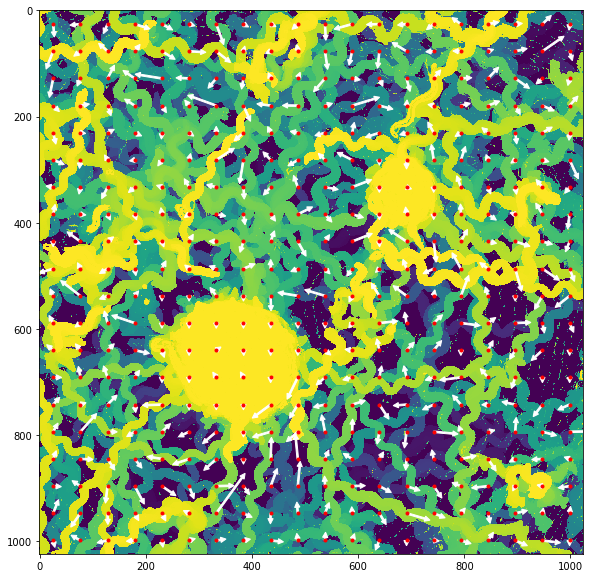

In [500]:
plt.figure(figsize = [10,10])
plt.imshow(stacking)
scale = 2
for i in range(num_bins):
    for j in range(num_bins):
        plt.plot(vf_loc[i,j,1],vf_loc[i,j,0],'r.')
        arrow = plt.arrow(vf_loc[i,j,1],vf_loc[i,j,0],
                          vf_vec[i,j,1]*scale,vf_vec[i,j,0]*scale,
                          width = 3,#length_includes_head = True,
                          shape = 'full',color = 'w',head_width = 10,head_length = 10)
plt.show()

In [504]:
num_bins = 20
bin_size = h/num_bins
num_directions = 4
vf_loc = np.reshape([(i, j) for i in range(num_bins) for j in range(num_bins)],(num_bins,num_bins,2))*bin_size + 0.5* bin_size
vf_vec = np.zeros((num_bins,num_bins,num_directions,2))
vf_count = vf_vec.copy()
for i in range(len(collect_x)):
    a = 1*(collect_dx[i] > 0) 
    b = 2*(collect_dy[i] > 0)
    k = a+b
    vf_vec[int(collect_x[i]/bin_size),int(collect_y[i]/bin_size),k][:] += [collect_dx[i], collect_dy[i]] 
    vf_count[int(collect_x[i]/bin_size), int(collect_y[i]/bin_size)][:] += 1
vf_vec = np.divide(vf_vec,vf_count,out=np.zeros_like(vf_vec), where=vf_count!=0)

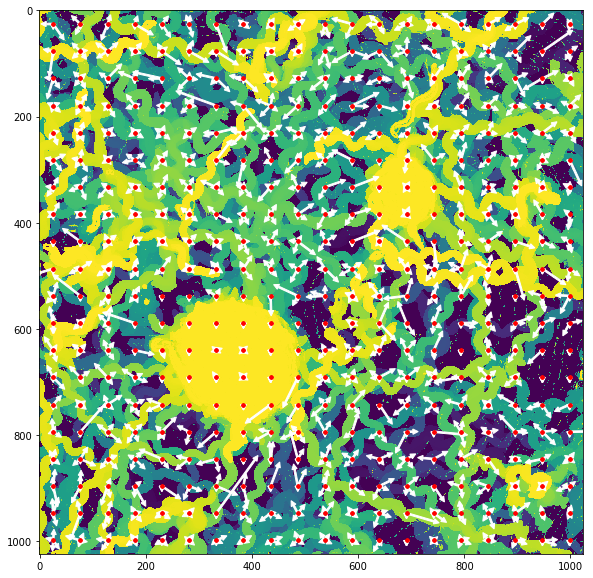

In [505]:
plt.figure(figsize = [10,10])
plt.imshow(stacking)
scale = 3

for i in range(num_bins):
    for j in range(num_bins):
        for k in range(num_directions):
            plt.plot(vf_loc[i,j,0],vf_loc[i,j,1],'r.')
            arrow = plt.arrow(vf_loc[i,j,0],vf_loc[i,j,1],
                              vf_vec[i,j,k,0]*scale,vf_vec[i,j,k,1]*scale,
                              width = 3,#length_includes_head = True,
                              shape = 'full',color = 'w',head_width = 10,head_length = 10)
plt.show()

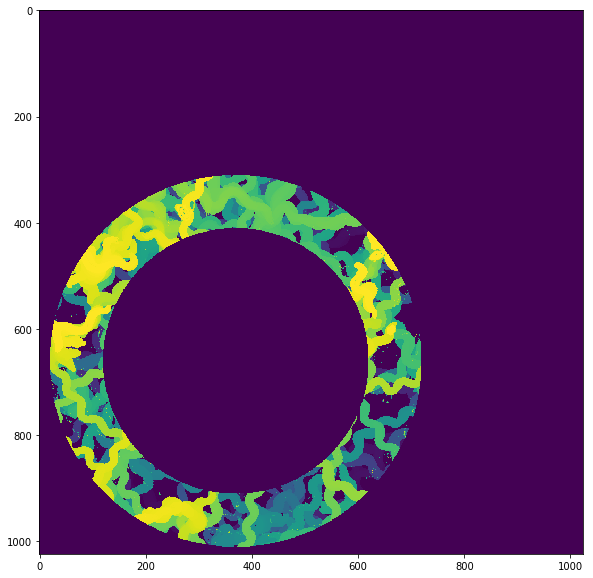

In [82]:
#show mask
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = [int(w/2), int(h/2)]
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[1])**2 + (Y-center[0])**2)

    mask = dist_from_center <= radius
    return mask
center = [660,370]
in_rad = 140
out_rad = 250
in_rad = 250
out_rad = 350
mask = create_circular_mask(h, w, center = center, radius=out_rad) * \
        (1-create_circular_mask(h, w, center = center, radius=in_rad))
plt.figure(figsize = [10,10])
plt.imshow(stacking*mask)
plt.show()

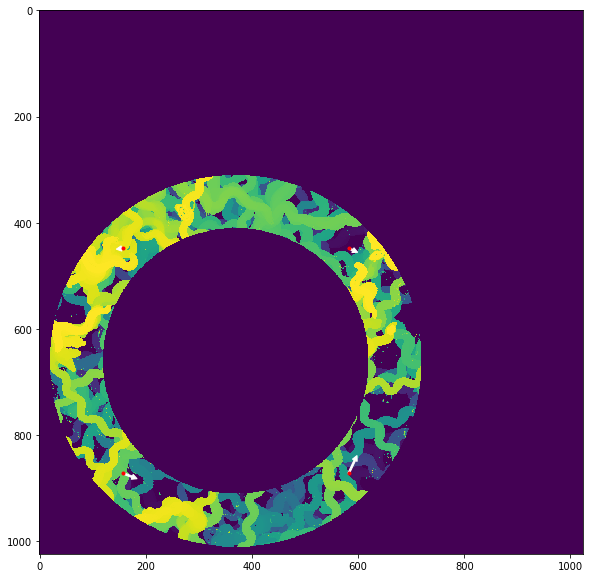

In [83]:
vf_loc = np.reshape([(i-0.5, j-0.5) for i in range(2) for j in range(2)],(4,2))*(in_rad+out_rad)/(np.sqrt(2))+center
vf_vec = np.zeros((4,2))
vf_count = vf_vec.copy()
for i in range(len(collect_x)):
    if mask[int(collect_y[i]), int(collect_x[i])] == 1:
        vf_vec[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i])>center[1])] += [collect_dy[i], collect_dx[i]] 
        vf_count[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i])>center[1])] += 1
vf_vec = np.divide(vf_vec,vf_count,out=np.zeros_like(vf_vec), where=vf_count!=0)


plt.figure(figsize = [10,10])
plt.imshow(stacking*mask)
for i in range(len(vf_loc)):
    plt.plot(vf_loc[i,1],vf_loc[i,0],'r.')
    plt.arrow(vf_loc[i,1],vf_loc[i,0],
                          vf_vec[i,1]*10,vf_vec[i,0]*10,
                          width = 3,#length_includes_head = True,
                          shape = 'full',color = 'w',head_width = 10,head_length = 10)
plt.show()

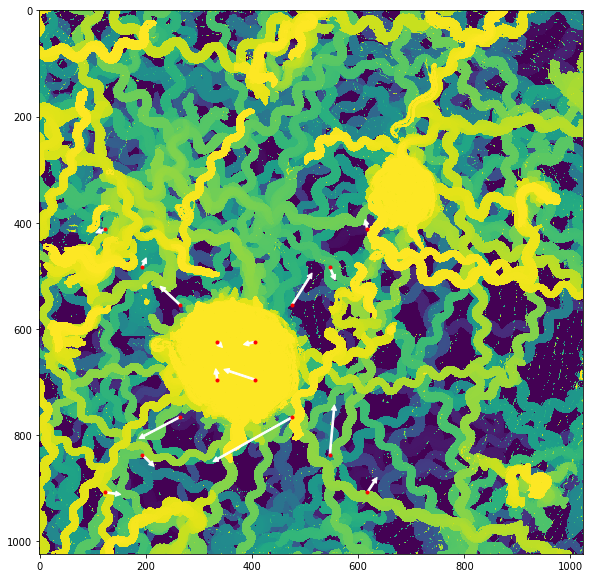

In [91]:
#show mask
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = [int(w/2), int(h/2)]
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[1])**2 + (Y-center[0])**2)

    mask = dist_from_center <= radius
    return mask
center = [660,370]
plt.figure(figsize = [10,10])
plt.imshow(stacking)
segment = 100
for in_rad in range(0,400,segment):
    out_rad = in_rad + segment
    mask = create_circular_mask(h, w, center = center, radius=out_rad) * \
            (1-create_circular_mask(h, w, center = center, radius=in_rad))


    vf_loc = np.reshape([(i-0.5, j-0.5) for i in range(2) for j in range(2)],(4,2))*(in_rad+out_rad)/(np.sqrt(2))+center
    vf_vec = np.zeros((4,2))
    vf_count = vf_vec.copy()
    for i in range(len(collect_x)):
        if mask[int(collect_y[i]), int(collect_x[i])] == 1:
            vf_vec[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i])>center[1])] += [collect_dy[i], collect_dx[i]] 
            vf_count[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i])>center[1])] += 1
    vf_vec = np.divide(vf_vec,vf_count,out=np.zeros_like(vf_vec), where=vf_count!=0)


    
    #plt.imshow(stacking*mask)
    for i in range(len(vf_loc)):
        plt.plot(vf_loc[i,1],vf_loc[i,0],'r.')
        plt.arrow(vf_loc[i,1],vf_loc[i,0],
                              vf_vec[i,1]*20,vf_vec[i,0]*20,
                              width = 3,#length_includes_head = True,
                              shape = 'full',color = 'w',head_width = 10,head_length = 10)
plt.show()

In [137]:
from skimage.morphology import skeletonize
import skimage.morphology as mor
from scipy.ndimage.morphology import binary_fill_holes
import scipy.ndimage as ndimage

In [38]:
0.2*len(time_series)/60*12.1

24.038666666666668

In [35]:
%%time
thin = np.zeros(np.shape(time_series))
for i in range(5) : #range(len(time_series)):
    fill_holes = binary_fill_holes(time_series[i])
    thin[i] = mor.thin(fill_holes)

Wall time: 12.1 s


In [39]:
%%time
thin = np.zeros(np.shape(time_series))
for i in range(5) : #range(len(time_series)):
    fill_holes = binary_fill_holes(time_series[i])
    thin[i] = mor.skeletonize(fill_holes)

Wall time: 1.27 s


In [47]:
#%%time
thin = np.zeros(np.shape(time_series))
for i in range(len(time_series)):
    fill_holes = binary_fill_holes(time_series[i])
    thin[i] = mor.medial_axis(fill_holes)

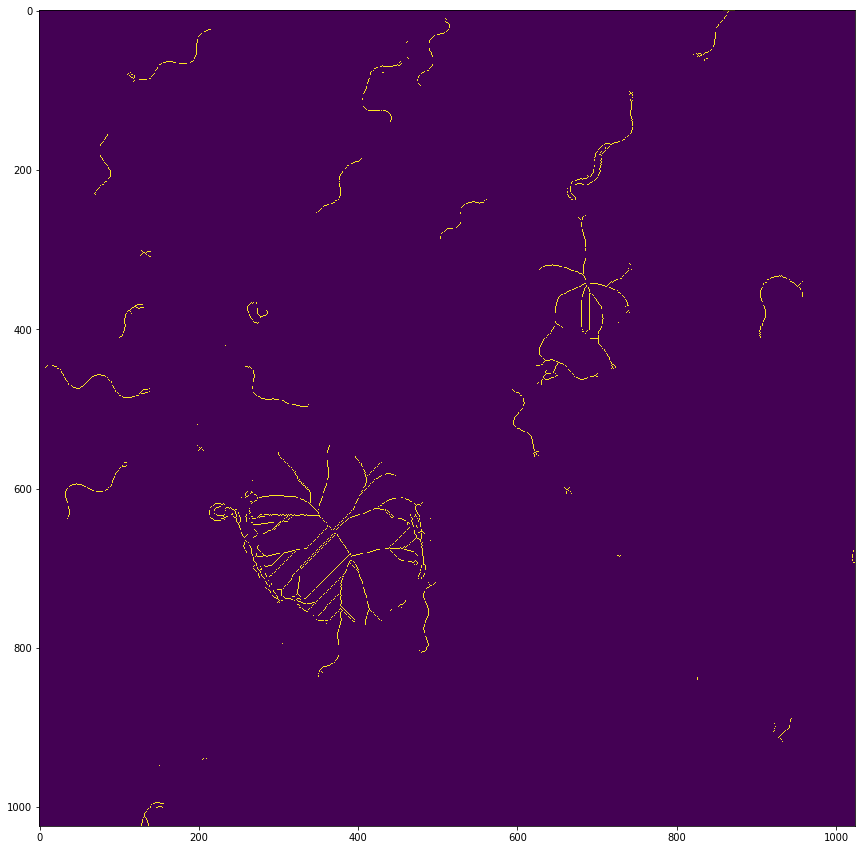

In [48]:
for i in range(len(thin)):
    plt.figure(figsize = [15,15])
    plt.imshow(thin[i])
    plt.show()
    display.clear_output(wait=True)

In [49]:
skeleton = np.zeros(np.shape(time_series))
for i in range(len(time_series)):
    fill_holes = binary_fill_holes(time_series[i])
    skeleton[i] = skeletonize(fill_holes)

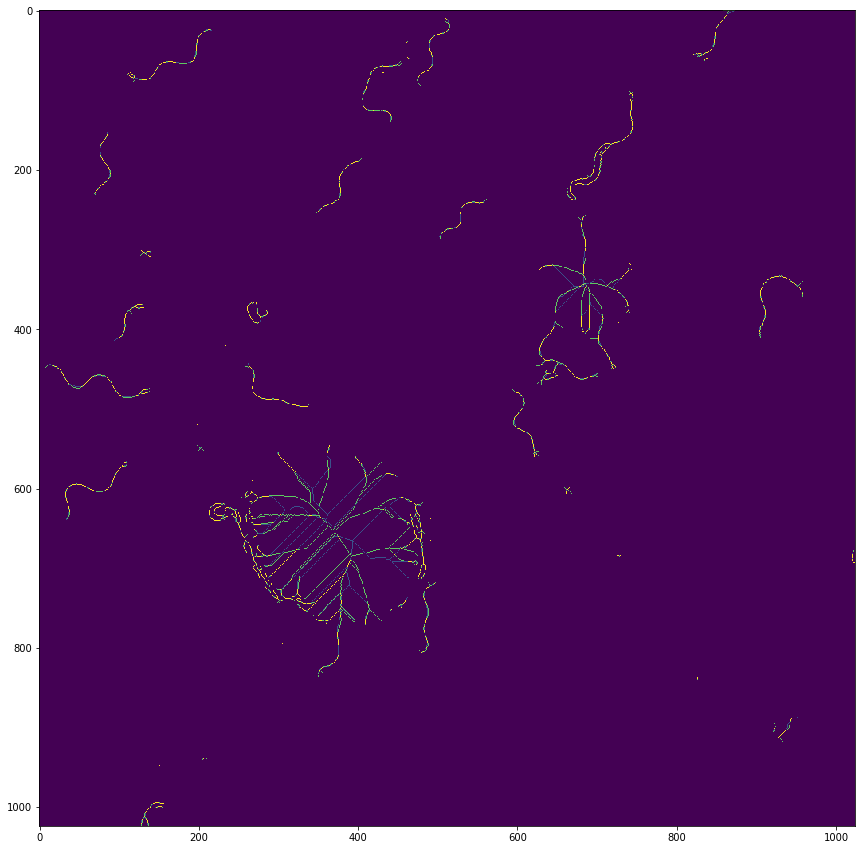

In [50]:
for i in range(len(skeleton)):
    plt.figure(figsize = [15,15])
    plt.imshow(skeleton[i]+3*thin[i])
    plt.show()
    display.clear_output(wait=True)


In [77]:
im+1

array([[1, 1, 1, ..., 4, 4, 4],
       [1, 1, 1, ..., 4, 4, 4],
       [1, 1, 1, ..., 4, 4, 4],
       ...,
       [4, 4, 4, ..., 1, 1, 1],
       [4, 4, 4, ..., 1, 1, 1],
       [1, 4, 1, ..., 1, 1, 1]])

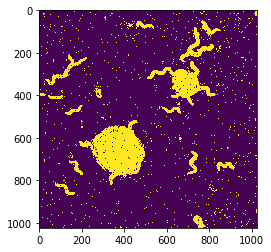

In [84]:
im = ((stack[1]>5)*3).astype(np.uint8)
plt.imshow(im+1)
plt.show()

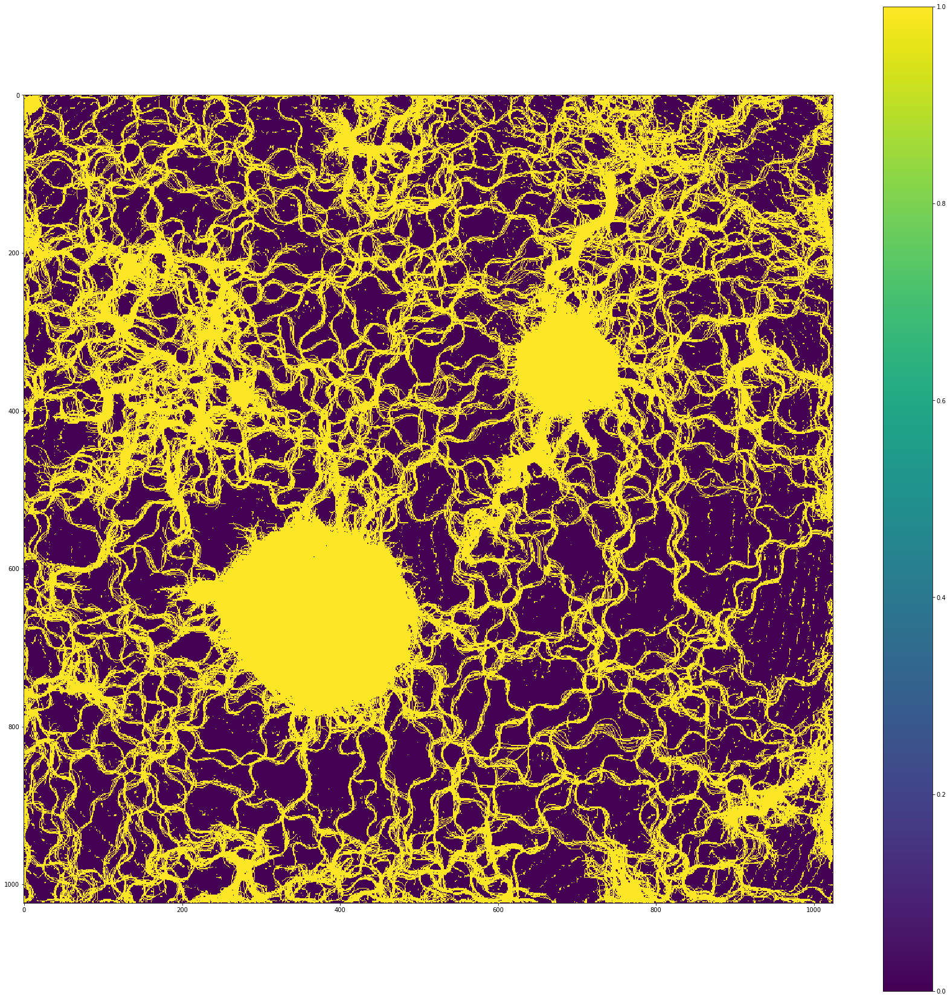

In [174]:
plt.figure(figsize = [30,30])
#plt.imshow(50*(flatten_skeleton>1))
plt.imshow((islands>0).astype(np.uint8))
#plt.imshow(markers)
plt.colorbar()
plt.show()

In [253]:
mask[np.where(markers == 0)]

array([0, 0, 0, ..., 0, 0, 0])

In [254]:
i

array([   0,    1,    2,    3,   13,   14,   15,   17,   18,   20,   21,
         33,   50,   56,   65,   71,   77,   79,   82,   85,   88,   96,
        106,  107,  111,  131,  145,  161,  176,  178,  179,  182,  187,
        190,  204,  206,  208,  211,  249,  252,  254,  264,  266,  268,
        270,  278,  296,  302,  304,  311,  314,  326,  328,  333,  335,
        343,  352,  365,  395,  422,  450,  455,  466,  471,  477,  479,
        487,  491,  495,  503,  512,  515,  516,  522,  528,  532,  537,
        555,  557,  574,  585,  592,  611,  615,  654,  663,  682,  695,
        698,  704,  709,  721,  730,  735,  817,  823,  832,  834,  937,
        941,  951,  990,  991, 1031, 1075, 1090, 1091, 1095, 1125, 1145,
       1152, 1157, 1167, 1171, 1173, 1250, 1256, 1258, 1286, 1288, 1322,
       1329, 1341, 1357, 1367, 1376, 1390, 1415, 1418, 1428, 1457, 1472,
       1483, 1497, 1514, 1525, 1532, 1541, 1558, 1561, 1564, 1586, 1589,
       1596, 1597, 1610, 1613, 1618, 1639, 1647, 16

In [282]:
np.min(markers),np.max(markers)

(0, 2810)

In [222]:
np.max(chosen_markers - markers)

0

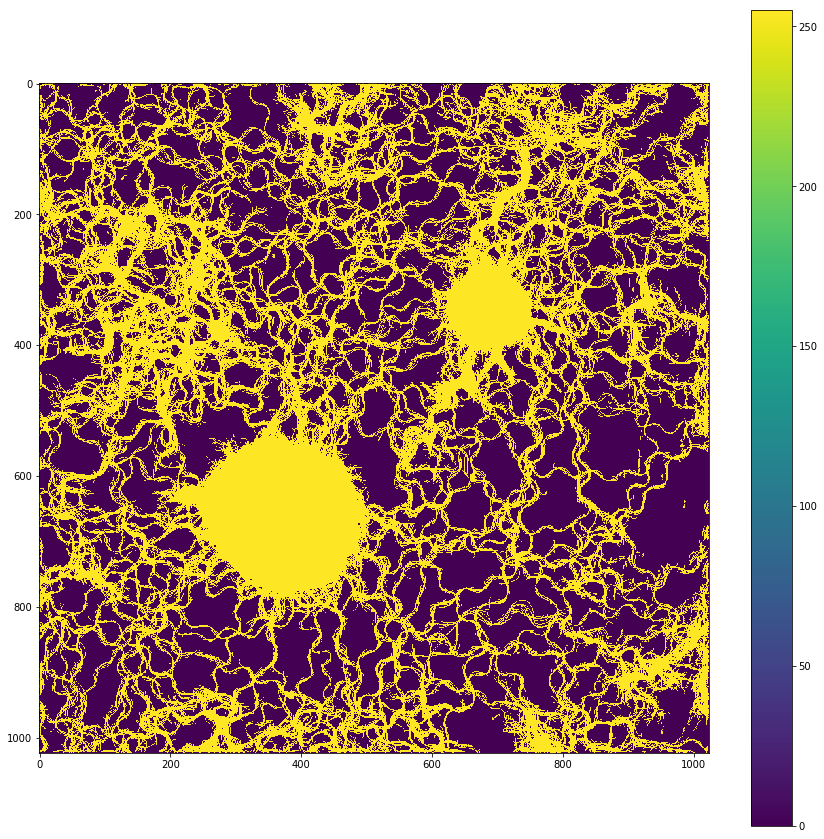

In [271]:
plt.figure(figsize = [15,15] )
plt.imshow(255*normalize(markers*mask).astype(np.bool).astype(np.uint8))
plt.colorbar()

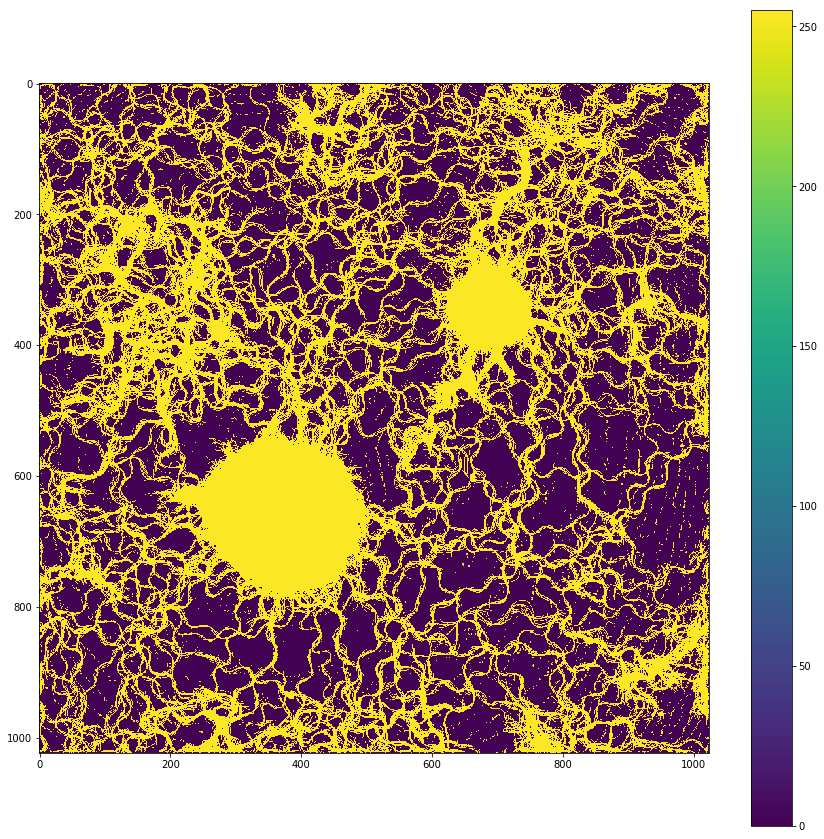

In [213]:
plt.figure(figsize = [15,15] )
plt.imshow(255*normalize(chosen_markers).astype(np.bool).astype(np.uint8))
plt.colorbar()

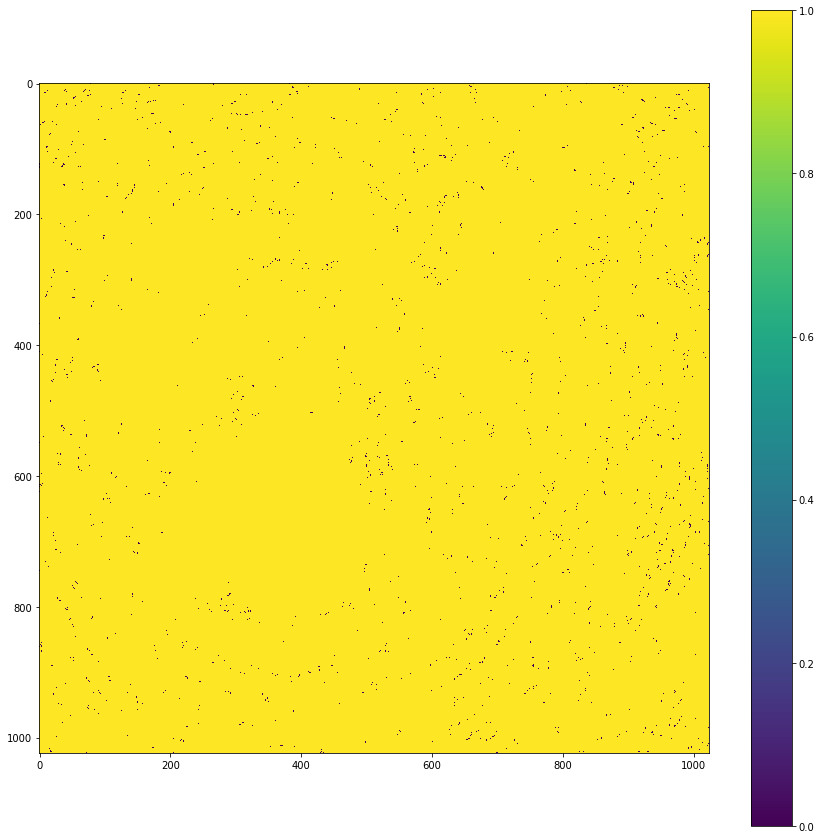

In [278]:
plt.figure(figsize = [15,15])
plt.imshow(mask)
plt.colorbar()

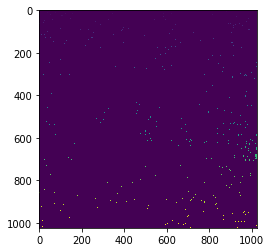

In [285]:
plt.imshow(normalize(markers))

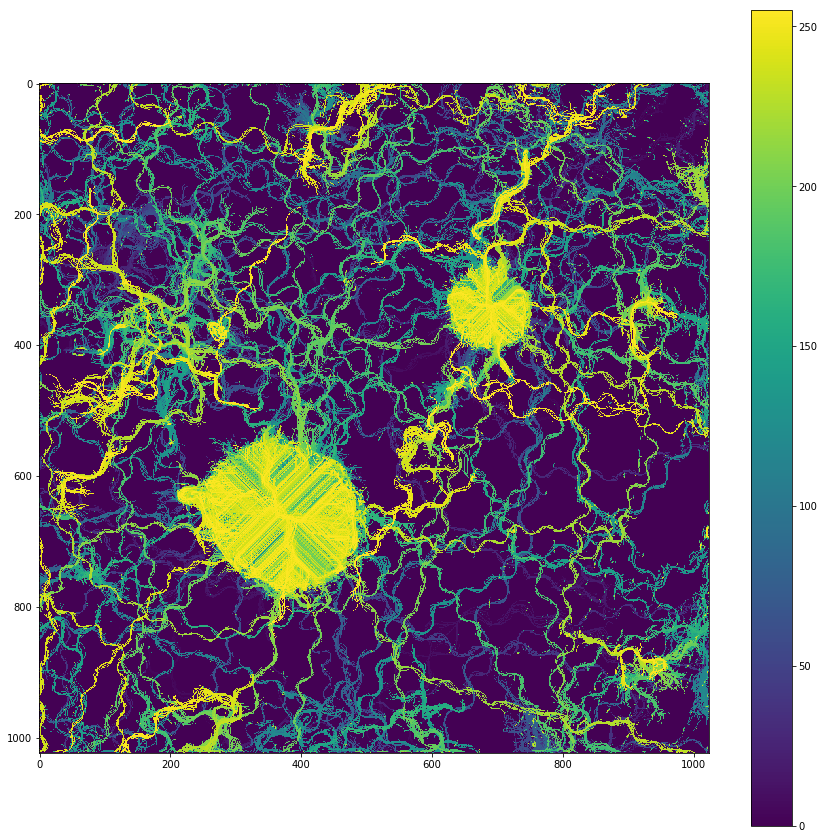

In [294]:
flatten_skeleton = np.amax((np.array(skeleton[range(0,len(skeleton),1)]).T*range(np.shape(skeleton)[0])).T,axis = 0)
# Copy the thresholded image. https://docs.opencv.org/3.1.0/d3/db4/tutorial_py_watershed.html
#im_th = np.array(ndimage.convolve(flatten_skeleton>0,np.ones([1,1]))).astype(int)
im_th = np.array((flatten_skeleton>0)).astype(int)

islands = im_th.astype(np.uint8)

#islands = cv2.bitwise_not(flatten_skeleton).astype(np.uint8)

# Marker labelling
#ret, markers = cv2.connectedComponents(islands)

connectivity = 4  # You need to choose 4 or 8 for connectivity type  https://stackoverflow.com/questions/35854197/how-to-use-opencvs-connected-components-with-stats-in-python
num_markers, markers, stats, centroids = cv2.connectedComponentsWithStats(islands , connectivity , cv2.CV_16U+cv2.CC_STAT_AREA )
chosen = np.where(stats[:,4]>50)
mask = np.zeros(np.shape(markers)).astype(int)
for i in chosen[0]:
    mask[np.where(markers == i)] = 1
    
plt.figure(figsize = [15,15])
#plt.imshow(markers)
plt.imshow(255*normalize(flatten_skeleton*mask))
plt.colorbar()
plt.show()

In [106]:
plt.figure(figsize = [15,15])
connectivity = 4
num_markers, markers, stats, centroids = cv2.connectedComponentsWithStats(skeleton[1] , connectivity , cv2.CV_16U+cv2.CC_STAT_AREA )
plt.imshow(markers)
#plt.imshow(flatten_skeleton[np.where(stats > )] )
plt.show()

error: OpenCV(3.4.2) C:\Miniconda3\conda-bld\opencv-suite_1534379934306\work\modules\imgproc\src\connectedcomponents.cpp:3936: error: (-215:Assertion failed) iDepth == 0 || iDepth == 1 in function 'cv::connectedComponents_sub1'


<Figure size 1080x1080 with 0 Axes>

In [51]:
thining = time_series[1:2]
element = cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3))
done = False

while( not done):
    eroded = cv2.erode(thining[0],element)
    temp = cv2.dilate(eroded,element)
    temp = cv2.subtract(img,temp)
    skel = cv2.bitwise_or(skel,temp)
    img = eroded.copy()

    zeros = size - cv2.countNonZero(img)
    if zeros==size:
        done = True
thin_stacking = thining
plt.figure(figsize = [15,15])
plt.imshow(thin_stacking)
plt.show()

error: OpenCV(3.4.2) C:\Miniconda3\conda-bld\opencv-suite_1534379934306\work\modules\core\src\matrix.cpp:755: error: (-215:Assertion failed) dims <= 2 && step[0] > 0 in function 'cv::Mat::locateROI'


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:23: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


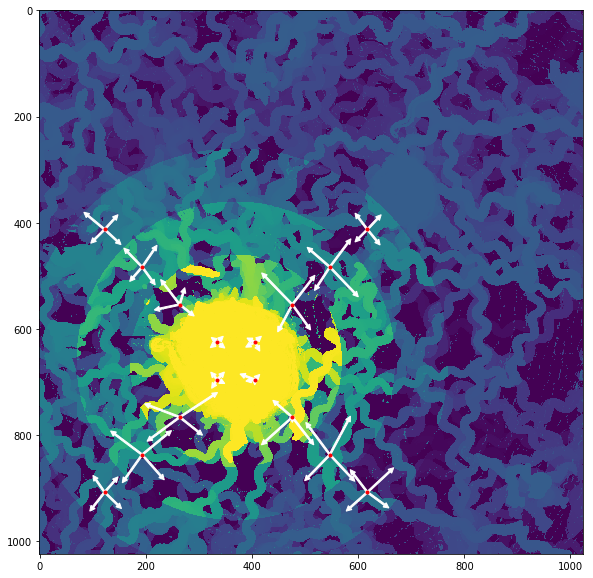

In [298]:
#show mask
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = [int(w/2), int(h/2)]
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[1])**2 + (Y-center[0])**2)

    mask = dist_from_center <= radius
    return mask
center = [660,370]
plt.figure(figsize = [10,10])
plt.imshow(stacking)
show = []
segment = 100
for in_rad in range(0,400,segment):
    out_rad = in_rad + segment
    mask = create_circular_mask(h, w, center = center, radius=out_rad) * \
            (1-create_circular_mask(h, w, center = center, radius=in_rad))
    if show == []:
        show = stacking
    else:
        show = show*(1+0.5*create_circular_mask(h, w, center = center, radius=out_rad))
    plt.imshow(show)


    vf_loc = np.reshape([(i-0.5, j-0.5) for i in range(2) for j in range(2)],(4,2))*(in_rad+out_rad)/(np.sqrt(2))+center
    vf_vec = np.zeros((4,4,2))
    vf_count = vf_vec.copy()
    for i in range(len(collect_x)):
        if mask[int(collect_y[i]), int(collect_x[i])] == 1:
            a = 1*(collect_dx[i] > 0) 
            b = 2*(collect_dy[i] > 0)
            k = a+b
            vf_vec[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i])>center[1]),k] += [collect_dy[i], collect_dx[i]] 
            vf_count[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i])>center[1]),k] += 1
    vf_vec = np.divide(vf_vec,vf_count,out=np.zeros_like(vf_vec), where=vf_count!=0)


    
    #plt.imshow(stacking*mask)
    for i in range(len(vf_loc)):
        plt.plot(vf_loc[i,1],vf_loc[i,0],'r.')
        for k in range(4):
            plt.arrow(vf_loc[i,1],vf_loc[i,0],
                              vf_vec[i,k,1]*5,vf_vec[i,k,0]*5,
                              width = 3,#length_includes_head = True,
                              shape = 'full',color = 'w',head_width = 10,head_length = 10)
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:23: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


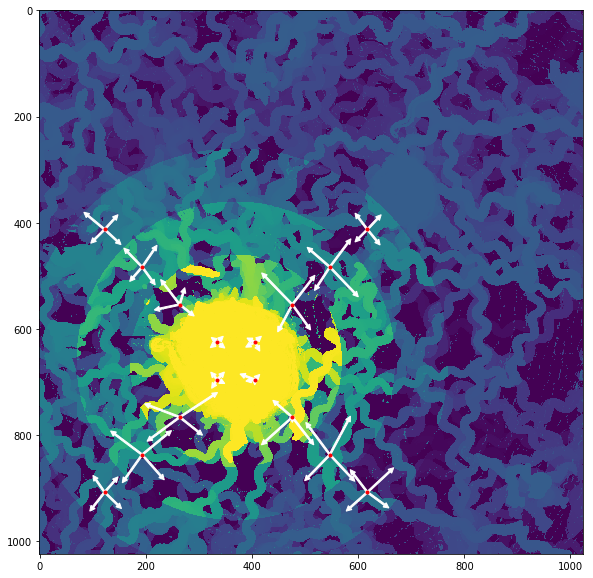

In [40]:
#show mask
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = [int(w/2), int(h/2)]
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[1])**2 + (Y-center[0])**2)

    mask = dist_from_center <= radius
    return mask
center = [660,370]
plt.figure(figsize = [10,10])
plt.imshow(stacking)
show = []
segment = 100
for in_rad in range(0,400,segment):
    out_rad = in_rad + segment
    mask = create_circular_mask(h, w, center = center, radius=out_rad) * \
            (1-create_circular_mask(h, w, center = center, radius=in_rad))
    if show == []:
        show = stacking
    else:
        show = show*(1+0.5*create_circular_mask(h, w, center = center, radius=out_rad))
    plt.imshow(show)


    vf_loc = np.reshape([(i-0.5, j-0.5) for i in range(2) for j in range(2)],(4,2))*(in_rad+out_rad)/(np.sqrt(2))+center
    vf_vec = np.zeros((4,4,2))
    vf_count = vf_vec.copy()
    for i in range(len(collect_x)):
        if mask[int(collect_y[i]), int(collect_x[i])] == 1:
            a = 1*(collect_dx[i] > 0) 
            b = 2*(collect_dy[i] > 0)
            k = a+b
            vf_vec[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i])>center[1]),k] += [collect_dy[i], collect_dx[i]] 
            vf_count[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i])>center[1]),k] += 1
    vf_vec = np.divide(vf_vec,vf_count,out=np.zeros_like(vf_vec), where=vf_count!=0)


    
    #plt.imshow(stacking*mask)
    for i in range(len(vf_loc)):
        plt.plot(vf_loc[i,1],vf_loc[i,0],'r.')
        for k in range(4):
            plt.arrow(vf_loc[i,1],vf_loc[i,0],
                              vf_vec[i,k,1]*5,vf_vec[i,k,0]*5,
                              width = 3,#length_includes_head = True,
                              shape = 'full',color = 'w',head_width = 10,head_length = 10)
plt.show()

In [299]:
vf_loc

array([[412.51262658, 122.51262658],
       [412.51262658, 617.48737342],
       [907.48737342, 122.51262658],
       [907.48737342, 617.48737342]])

array([[-1,  0],
       [ 1,  0],
       [ 0, -1],
       [ 0,  1]])

In [311]:
k

5.0

IndexError: index 5 is out of bounds for axis 1 with size 4

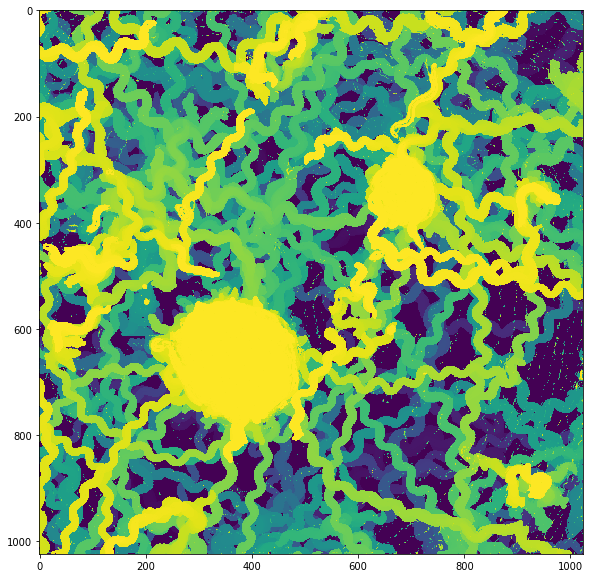

In [313]:
# cosine
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = [int(w/2), int(h/2)]
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[1])**2 + (Y-center[0])**2)

    mask = dist_from_center <= radius
    return mask
center = [660,370]
plt.figure(figsize = [10,10])
plt.imshow(stacking)
show = []
segment = 100
up = np.array([1,0])
right = np.array([0,1])
for in_rad in range(0,400,segment):
    out_rad = in_rad + segment
    mask = create_circular_mask(h, w, center = center, radius=out_rad) * \
            (1-create_circular_mask(h, w, center = center, radius=in_rad))
    if show == []:
        show = stacking
    else:
        show = show*(1+0.5*create_circular_mask(h, w, center = center, radius=out_rad))
    plt.imshow(show)


    vf_loc = np.reshape([-1, 0, 1, 0, 0, -1, 0, 1] , (4,2))*(in_rad+out_rad)/2+center # down up left right
    vf_vec = np.zeros((4,4,2))
    vf_count = vf_vec.copy()
    for i in range(len(collect_x)):
        if mask[int(collect_y[i]), int(collect_x[i])] == 1:
            a = 1*np.sign(collect_dx[i]) 
            b = 2*np.sign(collect_dy[i])
            k = (2+a+b).astype(int) # top = 3; right = 2; left = 1; bottom =0
            vf_vec[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i]+2)>center[1]),k] += [collect_dy[i], collect_dx[i]] 
            vf_count[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i]+2)>center[1]),k] += 1
    vf_vec = np.divide(vf_vec,vf_count,out=np.zeros_like(vf_vec), where=vf_count!=0)


    
    #plt.imshow(stacking*mask)
    for i in range(len(vf_loc)):
        plt.plot(vf_loc[i,1],vf_loc[i,0],'r.')
        for k in range(4):
            plt.arrow(vf_loc[i,1],vf_loc[i,0],
                              vf_vec[i,k,1]*5,vf_vec[i,k,0]*5,
                              width = 3,#length_includes_head = True,
                              shape = 'full',color = 'w',head_width = 10,head_length = 10)
plt.show()

In [459]:
[i for i in zip((collect_dy),(collect_dx))]

[(-0.4304821624631785, -0.6093585985536265),
 (-0.6329274263189717, -4.9647978792170875),
 (-1.3617584954437802, 4.5399096062203625),
 (2.439670970865393, -4.54274408600412),
 (-0.10936518889167246, -0.014266640040887069),
 (4.261121899913633, -9.03317941430538),
 (0.839164814886999, 2.587946538796473),
 (0.10219905893040959, 0.1955014734199949),
 (-24.795986461867074, 7.518389951627114),
 (8.956548698656093, 8.103023864915713),
 (0.6137006846188342, 0.48096322614685505),
 (5.722958540288801, 9.444109169518995),
 (-0.48831615931317174, -0.7596660925775041),
 (0.38900717428870735, -2.2561213963566047),
 (-1.3268214741644329, -3.290269161987112),
 (-1.3906846214723316, 3.1925781880652266),
 (0.31293205377227196, -1.581801132679871),
 (6.583723638265269, 16.48478875017986),
 (1.2426756886941348, -4.03426340851783),
 (0.7595453183473069, 2.768826595774044),
 (0.0669081747622613, -0.019868160437226834),
 (-22.990181603201563, -0.23815258913407433),
 (10.893978459171308, 6.793835586328186),


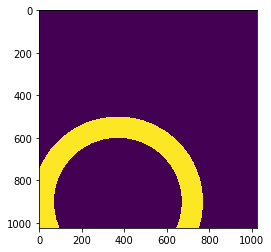

In [525]:
plt.imshow(mask)
plt.show()

In [567]:
vf_vec

array([[ -4.682664  ,  -4.14917811,   3.36922322,   4.76506735],
       [  0.        ,   0.        ,   0.        ,   0.        ],
       [ -6.02981903,  -4.1903034 ,   4.0590395 ,   6.66454312],
       [-11.48934208,  -4.32949669,   6.34721054,  11.24948461]])

In [566]:
vf_loc

array([[-300.,  450.],
       [-300., 1150.],
       [-650.,  800.],
       [  50.,  800.]])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


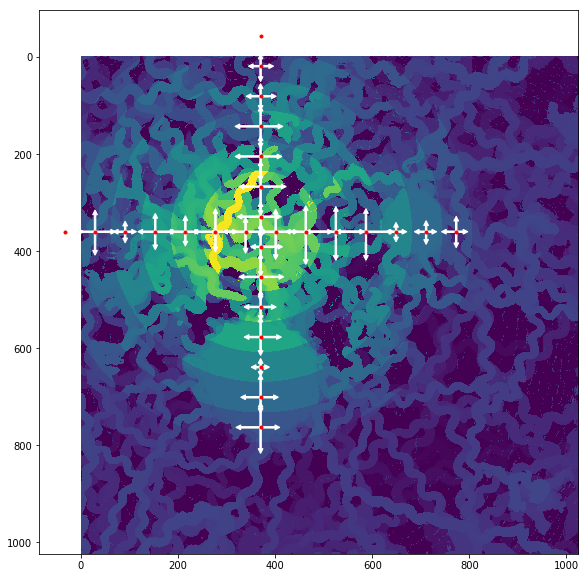

In [686]:
# cosine #blank area
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = [int(w/2), int(h/2)]
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    mask = dist_from_center <= radius
    return mask
def plotarrows(x,y,dx,dy,co):
    plt.arrow(x,y,
              dx*5,dy*5,
              width = 3,#length_includes_head = True,
              shape = 'full',color = co,head_width = 10,head_length = 10)
    
center = [370,360]
distance_conversion = 2.58
#center = [-100,-100]
plt.figure(figsize = [10,10])
plt.imshow(stacking)
show = []
segment = int(160/distance_conversion)
vf_vec_all = []
in_rads = range(0,400,segment)
for in_rad in in_rads:
    out_rad = in_rad + segment
    mask = create_circular_mask(h, w, center = center, radius=out_rad) * \
            (1-create_circular_mask(h, w, center = center, radius=in_rad))
    if show == []:
        show = stacking
    else:
        show = show*(1+0.3*create_circular_mask(h, w, center = center, radius=out_rad))
    plt.imshow(show)


    vf_loc = np.reshape([0, -1, -1, 0, 1, 0, 0, 1] , (4,2))*(in_rad+out_rad)/2+center # down left right up
    vf_vec = np.zeros((4,4))
    vf_count = vf_vec.copy()
    # signed axis: up 0, right 1, bottom 2, left 3
    up = 3
    right = 2
    down = 0
    left = 1
    direction = np.array([[left,down],[right,down],[left,up],[right, up]])
    for i in range(len(collect_x)):
        if mask[int(collect_y[i]), int(collect_x[i])] == 1:
            #vec_dot = collect_dx[i] # x1*x2 + y1*y2      # dot product between [0,1] and [y2,x2]
            #vec_det = collect_dy[i] #x1*y2 - y1*x2      # determinant
            #vec_zone = int(math.atan2(vec_det, vec_dot)*2/np.pi +2)%4  # atan2(y, x) or atan2(sin, cos)  bottom left 0; bottom right 1; top right 2; top left 3.

            #a = 1*np.sign(collect_dx[i]) 
            #b = 2*np.sign(collect_dy[i])
            a_vec = 1*(collect_dx[i]>0) 
            b_vec = 2*(collect_dy[i]>0)
            vec_zone = (a_vec+b_vec).astype(int) # downleft =0;d ownright = 1; upleft = 2; upright = 3
            
            #vf_vec[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i]+2)>center[1]),k] += [collect_dy[i], collect_dx[i]] 
            #vf_count[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i]+2)>center[1]),k] += 1
            #loc_dot = int(collect_y[i])-center[0]
            #loc_det = int(collect_x[i])-center[1]
            #loc_zone = int(math.atan2(loc_det, loc_dot)*2/np.pi +2)%4  # atan2(y, x) or atan2(sin, cos)  bottom left 0; bottom right 1; top right 2; top left 3.
            
            #a = 1*np.sign(collect_x[i]) 
            #b = 2*np.sign(collect_y[i])
            a_loc = 1*(collect_x[i]-center[0]>0) 
            b_loc = 2*(collect_y[i]-center[1]>0)
            loc_zone = (a_loc+b_loc).astype(int) # downleft =0;d ownright = 1; upleft = 2; upright = 3
            
            for j in range(2):
                vf_vec[direction[loc_zone,j],direction[vec_zone,0]] += collect_dx[i]
                vf_vec[direction[loc_zone,j],direction[vec_zone,1]] += collect_dy[i]            
                vf_count[direction[loc_zone,j],direction[vec_zone,0]] += 1
                vf_count[direction[loc_zone,j],direction[vec_zone,1]] += 1
            #print(b_vec,a_vec,vec_zone)
            #print(collect_dy[i],collect_dx[i],vec_zone)
            #print(collect_y[i],collect_x[i],loc_zone)
            #print(collect_dy[i],collect_dx[i])
            
          
    vf_vec = np.divide(vf_vec,vf_count,out=np.zeros_like(vf_vec), where=vf_count!=0)

    
    vf_vec_all.append(vf_vec)
    #plt.imshow(stacking*mask)
    for i in range(len(vf_loc)):
        plt.plot(vf_loc[i,0],vf_loc[i,1],'r.')
        plotarrows(vf_loc[i,0],vf_loc[i,1],0,vf_vec[i,0],'w')
        plotarrows(vf_loc[i,0],vf_loc[i,1],vf_vec[i,1],0,'w')
        plotarrows(vf_loc[i,0],vf_loc[i,1],vf_vec[i,2],0,'w')
        plotarrows(vf_loc[i,0],vf_loc[i,1],0,vf_vec[i,3],'w')
plt.show()

from scipy.stats import sem as sem
speed_conversion = 2.58000 # 1pix/sec = 2.58um/sec

vf_vec_abs = np.absolute(vf_vec_all)
v_inf = np.zeros(len(vf_vec_abs))
v_inf_se = np.zeros(len(vf_vec_abs))

for i in range(len(vf_vec_abs)):
    v_inf[i] = speed_conversion * np.average([vf_vec_abs[i,down,up],vf_vec_abs[i,up,down],vf_vec_abs[i,left,right],vf_vec_abs[i,right,left],
        vf_vec_abs[i,down,down],vf_vec_abs[i,up,up],vf_vec_abs[i,left,left],vf_vec_abs[i,right,right],
        vf_vec_abs[i,down,left],vf_vec_abs[i,up,left],vf_vec_abs[i,left,up],vf_vec_abs[i,right,up],
        vf_vec_abs[i,down,right],vf_vec_abs[i,up,right],vf_vec_abs[i,left,down],vf_vec_abs[i,right,down]])
for i in range(len(vf_vec_abs)):
    v_inf_se[i] = speed_conversion * sem([vf_vec_abs[i,down,up],vf_vec_abs[i,up,down],vf_vec_abs[i,left,right],vf_vec_abs[i,right,left],
        vf_vec_abs[i,down,down],vf_vec_abs[i,up,up],vf_vec_abs[i,left,left],vf_vec_abs[i,right,right],
        vf_vec_abs[i,down,left],vf_vec_abs[i,up,left],vf_vec_abs[i,left,up],vf_vec_abs[i,right,up],
        vf_vec_abs[i,down,right],vf_vec_abs[i,up,right],vf_vec_abs[i,left,down],vf_vec_abs[i,right,down]])


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


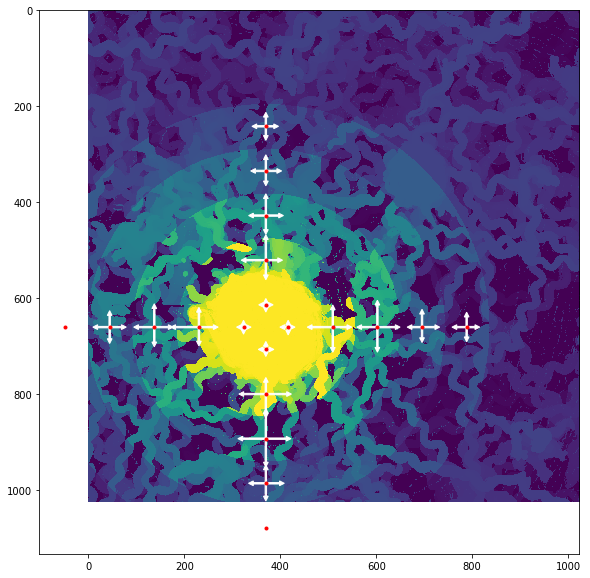

In [760]:
# cosine
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = [int(w/2), int(h/2)]
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    mask = dist_from_center <= radius
    return mask
def plotarrows(x,y,dx,dy,co):
    plt.arrow(x,y,
              dx*5,dy*5,
              width = 3,#length_includes_head = True,
              shape = 'full',color = co,head_width = 10,head_length = 10)
    
center = [370,660]
distance_conversion = 2.58
#center = [-100,-100]
plt.figure(figsize = [10,10])
plt.imshow(stacking)
show = []
segment = int(240/distance_conversion)
vf_vec_all = []
in_rads = range(0,400,segment)
for in_rad in in_rads:
    out_rad = in_rad + segment
    mask = create_circular_mask(h, w, center = center, radius=out_rad) * \
            (1-create_circular_mask(h, w, center = center, radius=in_rad))
    if show == []:
        show = stacking
    else:
        show = show*(1+0.5*create_circular_mask(h, w, center = center, radius=out_rad))
    plt.imshow(show)


    vf_loc = np.reshape([0, -1, -1, 0, 1, 0, 0, 1] , (4,2))*(in_rad+out_rad)/2+center # down left right up
    vf_vec = np.zeros((4,4))
    vf_count = vf_vec.copy()
    # signed axis: up 0, right 1, bottom 2, left 3
    up = 3
    right = 2
    down = 0
    left = 1
    direction = np.array([[left,down],[right,down],[left,up],[right, up]])
    for i in range(len(collect_x)):
        if mask[int(collect_y[i]), int(collect_x[i])] == 1:
            #vec_dot = collect_dx[i] # x1*x2 + y1*y2      # dot product between [0,1] and [y2,x2]
            #vec_det = collect_dy[i] #x1*y2 - y1*x2      # determinant
            #vec_zone = int(math.atan2(vec_det, vec_dot)*2/np.pi +2)%4  # atan2(y, x) or atan2(sin, cos)  bottom left 0; bottom right 1; top right 2; top left 3.

            #a = 1*np.sign(collect_dx[i]) 
            #b = 2*np.sign(collect_dy[i])
            a_vec = 1*(collect_dx[i]>0) 
            b_vec = 2*(collect_dy[i]>0)
            vec_zone = (a_vec+b_vec).astype(int) # downleft =0;d ownright = 1; upleft = 2; upright = 3
            
            #vf_vec[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i]+2)>center[1]),k] += [collect_dy[i], collect_dx[i]] 
            #vf_count[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i]+2)>center[1]),k] += 1
            #loc_dot = int(collect_y[i])-center[0]
            #loc_det = int(collect_x[i])-center[1]
            #loc_zone = int(math.atan2(loc_det, loc_dot)*2/np.pi +2)%4  # atan2(y, x) or atan2(sin, cos)  bottom left 0; bottom right 1; top right 2; top left 3.
            
            #a = 1*np.sign(collect_x[i]) 
            #b = 2*np.sign(collect_y[i])
            a_loc = 1*(collect_x[i]-center[0]>0) 
            b_loc = 2*(collect_y[i]-center[1]>0)
            loc_zone = (a_loc+b_loc).astype(int) # downleft =0;d ownright = 1; upleft = 2; upright = 3
            
            for j in range(2):
                vf_vec[direction[loc_zone,j],direction[vec_zone,0]] += collect_dx[i]
                vf_vec[direction[loc_zone,j],direction[vec_zone,1]] += collect_dy[i]            
                vf_count[direction[loc_zone,j],direction[vec_zone,0]] += 1
                vf_count[direction[loc_zone,j],direction[vec_zone,1]] += 1
            #print(b_vec,a_vec,vec_zone)
            #print(collect_dy[i],collect_dx[i],vec_zone)
            #print(collect_y[i],collect_x[i],loc_zone)
            #print(collect_dy[i],collect_dx[i])
            
          
    vf_vec = np.divide(vf_vec,vf_count,out=np.zeros_like(vf_vec), where=vf_count!=0)

    
    vf_vec_all.append(vf_vec)
    #plt.imshow(stacking*mask)
    for i in range(len(vf_loc)):
        plt.plot(vf_loc[i,0],vf_loc[i,1],'r.')
        plotarrows(vf_loc[i,0],vf_loc[i,1],0,vf_vec[i,0],'w')
        plotarrows(vf_loc[i,0],vf_loc[i,1],vf_vec[i,1],0,'w')
        plotarrows(vf_loc[i,0],vf_loc[i,1],vf_vec[i,2],0,'w')
        plotarrows(vf_loc[i,0],vf_loc[i,1],0,vf_vec[i,3],'w')
plt.show()

In [756]:
from scipy.stats import sem as sem
speed_conversion = 2.58000 # 1pix/sec = 2.58um/sec

vf_vec_abs = np.absolute(vf_vec_all)
v_inward = np.zeros(len(vf_vec_abs))
v_outward = np.zeros(len(vf_vec_abs))
v_tangential = np.zeros(len(vf_vec_abs))
v_inward_se = np.zeros(len(vf_vec_abs))
v_outward_se = np.zeros(len(vf_vec_abs))
v_tangential_se = np.zeros(len(vf_vec_abs))

for i in range(len(vf_vec_abs)):
    v_inward[i] = speed_conversion * np.average([vf_vec_abs[i,down,up],vf_vec_abs[i,up,down],vf_vec_abs[i,left,right],vf_vec_abs[i,right,left]])
    v_outward[i] = speed_conversion * np.average([vf_vec_abs[i,down,down],vf_vec_abs[i,up,up],vf_vec_abs[i,left,left],vf_vec_abs[i,right,right]])
    v_tangential[i] = speed_conversion * np.average([vf_vec_abs[i,down,left],vf_vec_abs[i,up,left],vf_vec_abs[i,left,up],vf_vec_abs[i,right,up],
                         vf_vec_abs[i,down,right],vf_vec_abs[i,up,right],vf_vec_abs[i,left,down],vf_vec_abs[i,right,down]])
for i in range(len(vf_vec_abs)):
    v_inward_se[i] = speed_conversion * sem([vf_vec_abs[i,down,up],vf_vec_abs[i,up,down],vf_vec_abs[i,left,right],vf_vec_abs[i,right,left]])
    v_outward_se[i] = speed_conversion * sem([vf_vec_abs[i,down,down],vf_vec_abs[i,up,up],vf_vec_abs[i,left,left],vf_vec_abs[i,right,right]])
    v_tangential_se[i] = speed_conversion * sem([vf_vec_abs[i,down,left],vf_vec_abs[i,up,left],vf_vec_abs[i,left,up],vf_vec_abs[i,right,up],
                         vf_vec_abs[i,down,right],vf_vec_abs[i,up,right],vf_vec_abs[i,left,down],vf_vec_abs[i,right,down]])


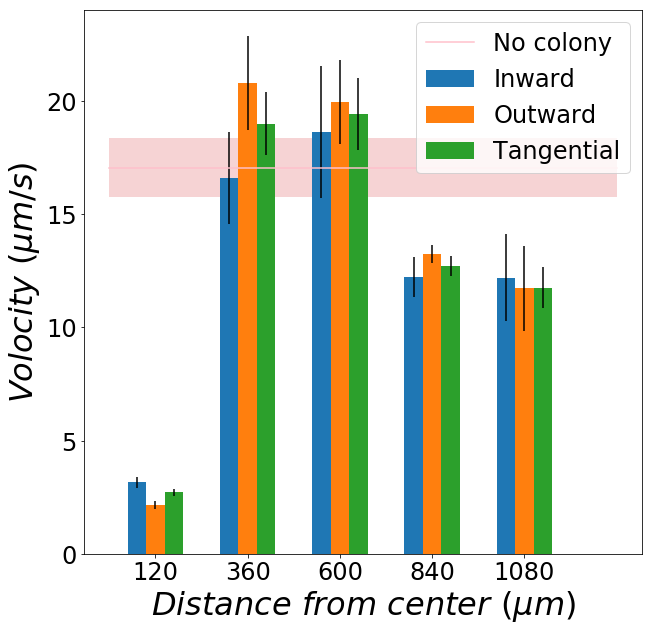

In [768]:
from matplotlib import mathtext
ind = np.arange(len(v_inward))  # the x locations for the groups
width = 0.2  # the width of the bars

fig, ax = plt.subplots(figsize = [10,10])
x = np.linspace(-0.5,len(v_inward),len(v_inward))

rects1 = ax.bar(ind - width, v_inward, width, yerr=v_inward_se,
                label='Inward')
rects2 = ax.bar(ind, v_outward, width, yerr=v_outward_se,
                label='Outward')
rects3 = ax.bar(ind + width, v_tangential, width, yerr=v_tangential_se,
                label='Tangential')
#rects4 = ax.bar(ind + 2*width, v_inf, width, yerr=v_inf_se,
#                label='Free')

ax.plot(x, np.repeat(v_inf[0],len(v_inward)),color = "pink", label = "No colony")
ax.fill_between(x, v_inf[0]-v_inf_se[0], v_inf[0]+v_inf_se[0],
    alpha=0.2)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel(r'$Volocity\ ({\mu}m/s)$',fontsize = 32)
ax.set_xlabel(r'$Distance\ from\ center\ ({\mu}m)$',fontsize = 32)
#ax.set_title('Volocity near colony')
ax.set_xticks(ind)
xlabels = [str(int(round(((i+segment/2)*speed_conversion),-1))) for i in in_rads]
ax.set_xticklabels(xlabels, fontsize =24)
ax.tick_params(axis="y", labelsize=24)
ax.legend(fontsize = 24)

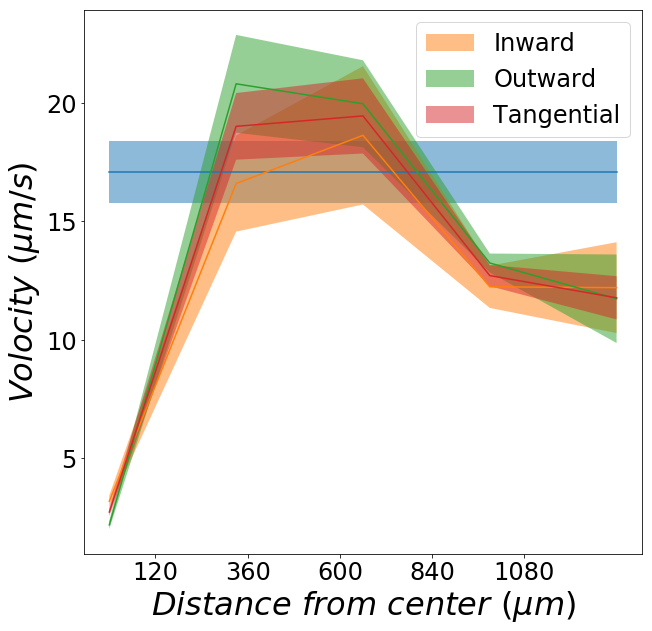

In [758]:
from matplotlib import mathtext
ind = np.arange(len(v_inward))  # the x locations for the groups
width = 0.2  # the width of the bars

fig, ax = plt.subplots(figsize = [10,10])

x = np.linspace(-0.5,len(v_inward),len(v_inward))
ax.plot(x, np.repeat(v_inf[0],len(v_inward)))



ax.fill_between(x, v_inf[0]-v_inf_se[0], v_inf[0]+v_inf_se[0],
    alpha=0.5)
ax.plot(x, v_inward)
rects1 = ax.fill_between(x, v_inward-v_inward_se, v_inward+v_inward_se,
    alpha=0.5, label='Inward' )
ax.plot(x, v_outward)
rects2 = ax.fill_between(x, v_outward-v_outward_se, v_outward+v_outward_se,
    alpha=0.5, label='Outward')
ax.plot(x, v_tangential)
rects3 = ax.fill_between(x, v_tangential-v_tangential_se, v_tangential+v_tangential_se,
    alpha=0.5, label='Tangential')

#rects4 = ax.bar(ind + 2*width, v_inf, width, yerr=v_inf_se,
#                label='Free')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel(r'$Volocity\ ({\mu}m/s)$',fontsize = 32)
ax.set_xlabel(r'$Distance\ from\ center\ ({\mu}m)$',fontsize = 32)
#ax.set_title('Volocity near colony')
ax.set_xticks(ind)
xlabels = [str(int(round(((i+segment/2)*speed_conversion),-1))) for i in in_rads]
ax.set_xticklabels(xlabels, fontsize =24)
ax.tick_params(axis="y", labelsize=24)
ax.legend(fontsize = 24)

In [396]:
np.shape(averaged_vf_vec_by_sign)

(3,)

In [399]:
averaged_vf_vec_by_sign[:,:,:]

array([[[ 1874.84513982,  -292.43949393],
        [  117.51007396,  -218.64261914],
        [-1759.37909883,   -26.29627585],
        [   -2.04403297,  -100.09315065]],

       [[ 1121.8176355 ,   259.29585562],
        [ -109.13152886,   139.46330928],
        [-1056.34998841,   213.29697566],
        [  174.59917595,   333.129522  ]],

       [[  931.07532634,   -86.26899804],
        [ -148.52596968,   133.38231177],
        [-1269.22754806,   306.92475472],
        [ -189.62625204,    87.27344492]],

       [[  961.76837558,  -297.28552271],
        [  -83.98780128,    45.51560124],
        [-1211.79486161,   238.87206738],
        [ -166.03868474,  -103.92905658]]])

In [389]:
vf_vec

array([[[ -766.31731435,  -926.23727042],
        [ -993.06178448,   899.94099457],
        [  764.27328137,   826.14411978],
        [ 1110.57185844, -1118.58361371]],

       [[ -451.96751366,  -314.82348332],
        [ -604.38247475,   528.12045898],
        [  626.56668961,   647.95300533],
        [  495.25094589,  -388.6571497 ]],

       [[ -575.41240474,  -438.65752113],
        [ -693.81514332,   745.58227586],
        [  385.7861527 ,   525.93096605],
        [  545.28917365,  -612.19996409]],

       [[ -528.74971127,  -401.27577315],
        [ -683.04515035,   640.14784053],
        [  362.71102652,   297.34671657],
        [  599.05734906,  -594.63223928]]])

In [385]:
x1 = 1
y1 = 0
x2 = 0.01
y2 = -1
dot = x1*x2 + y1*y2      # dot product
det = x1*y2 - y1*x2      # determinant
angle = int(math.atan2(det, dot)*2/np.pi +2)  # atan2(y, x) or atan2(sin, cos)  bottom left 0; bottom right 1; top right 2; top left 3.
print(angle)

1


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  """
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  


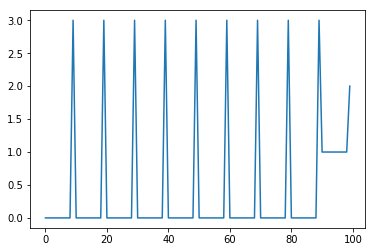

In [374]:
import math
step = 0.1
angles = np.zeros(np.int(1/0.1**2)+1)
i = 0
for x2 in np.linspace(-1,step,1.0/step):
    for y2 in np.linspace(-1,step,1.0/step):
        x1 = 1
        y1 = 0
        dot = x1*x2 + y1*y2      # dot product
        det = x1*y2 - y1*x2      # determinant
        angles[i] = math.atan2(det, dot)*2/np.pi +2  # atan2(y, x) or atan2(sin, cos)
        i += 1
plt.plot(angles.astype(int))
plt.show()

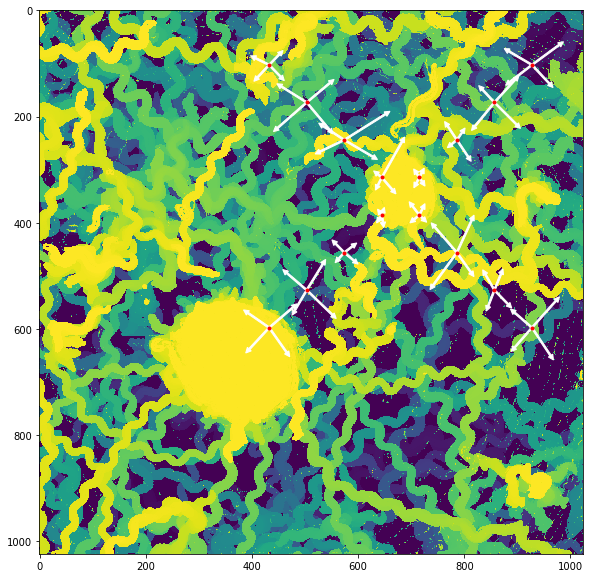

In [100]:
#show mask
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = [int(w/2), int(h/2)]
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[1])**2 + (Y-center[0])**2)

    mask = dist_from_center <= radius
    return mask
center = [350,680]
plt.figure(figsize = [10,10])
plt.imshow(stacking)
segment = 100
for in_rad in range(0,400,segment):
    out_rad = in_rad + segment
    mask = create_circular_mask(h, w, center = center, radius=out_rad) * \
            (1-create_circular_mask(h, w, center = center, radius=in_rad))


    vf_loc = np.reshape([(i-0.5, j-0.5) for i in range(2) for j in range(2)],(4,2))*(in_rad+out_rad)/(np.sqrt(2))+center
    vf_vec = np.zeros((4,4,2))
    vf_count = vf_vec.copy()
    for i in range(len(collect_x)):
        if mask[int(collect_y[i]), int(collect_x[i])] == 1:
            a = 1*(collect_dx[i] > 0) 
            b = 2*(collect_dy[i] > 0)
            k = a+b
            vf_vec[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i])>center[1]),k] += [collect_dy[i], collect_dx[i]] 
            vf_count[2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i])>center[1]),k] += 1
    vf_vec = np.divide(vf_vec,vf_count,out=np.zeros_like(vf_vec), where=vf_count!=0)


    
    #plt.imshow(stacking*mask)
    for i in range(len(vf_loc)):
        plt.plot(vf_loc[i,1],vf_loc[i,0],'r.')
        for k in range(4):
            plt.arrow(vf_loc[i,1],vf_loc[i,0],
                              vf_vec[i,k,1]*5,vf_vec[i,k,0]*5,
                              width = 3,#length_includes_head = True,
                              shape = 'full',color = 'w',head_width = 10,head_length = 10)
plt.show()

In [70]:
2*(int(collect_y[i])>center[0]) + 1*(int(collect_x[i])>center[1])

0

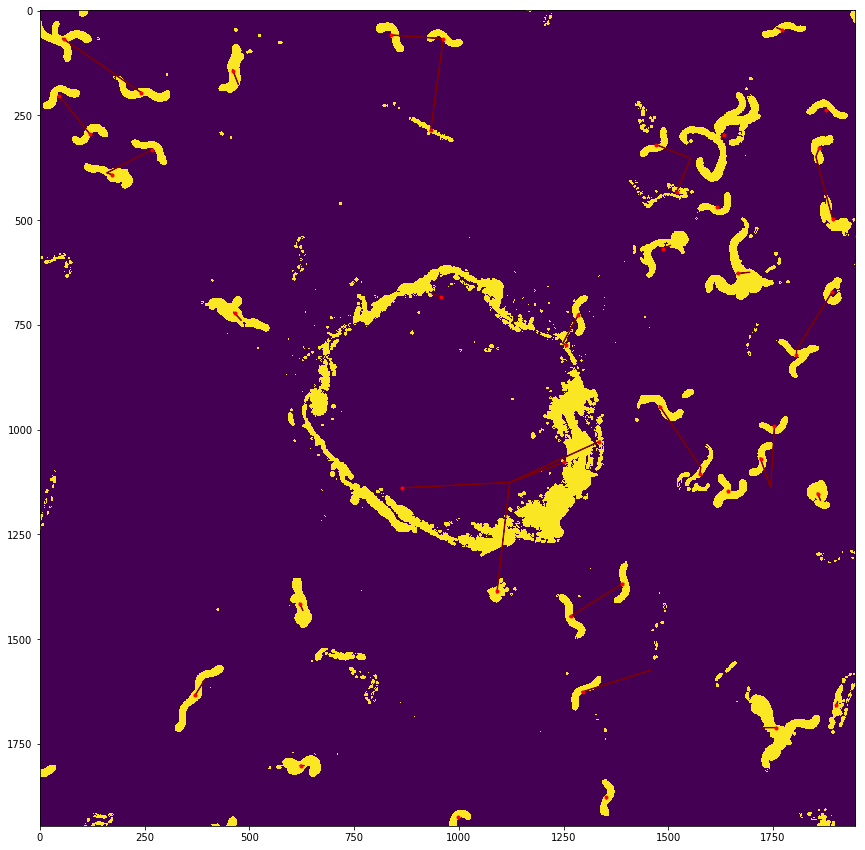

In [125]:
plt.figure(figsize = [15,15])
plt.imshow(islands)
for i in range(len(mapping)):
    distance = mapping[i][2]
    x = mapping[i][1][0]   #last frame
    y = mapping[i][1][1]
    dx = mapping[i][0][0] - mapping[i][1][0]
    dy = mapping[i][0][1] - mapping[i][1][1]
    plt.plot(x+dx,y+dy,'r.')

    if (distance < 300):# & (num_markers <20):
        arrow = plt.arrow(x,y,dx,dy,width = 1,shape = 'full',color = colors[ind])
        arrows.append([arrow])
        #t=ax.text(x,y,str(distance))
        #t.set_bbox(dict(facecolor='white', alpha=0.5, edgecolor= 'white'))
                    

plt.show()

In [118]:
np.shape(centroids_current)

(128, 2)

In [121]:
mapping[2]

(array([1424.74420601,  345.34878398]),
 array([1181.50741351,  673.6276771 ]),
 409.0)

In [92]:
np.shape(stack)

(7, 2868, 2868)

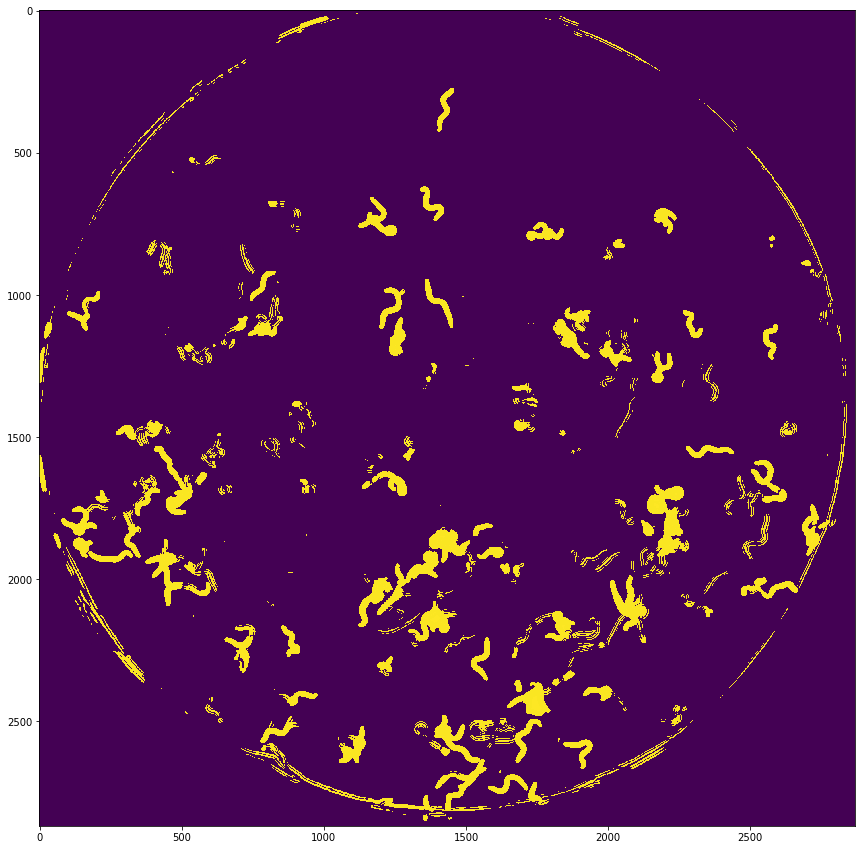

In [99]:
plt.figure(figsize = [15,15])
plt.imshow(islands)
plt.show()

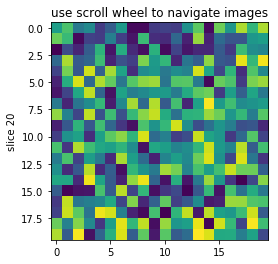

In [762]:
%matplotlib inline

#from __future__ import print_function

import numpy as np
import matplotlib.pyplot as plt


class IndexTracker(object):
    def __init__(self, ax, X):
        self.ax = ax
        ax.set_title('use scroll wheel to navigate images')

        self.X = X
        rows, cols, self.slices = X.shape
        self.ind = self.slices//2

        self.im = ax.imshow(self.X[:, :, self.ind])
        self.update()

    def onscroll(self, event):
        print("%s %s" % (event.button, event.step))
        if event.button == 'up':
            self.ind = (self.ind + 1) % self.slices
        else:
            self.ind = (self.ind - 1) % self.slices
        self.update()

    def update(self):
        self.im.set_data(self.X[:, :, self.ind])
        ax.set_ylabel('slice %s' % self.ind)
        self.im.axes.figure.canvas.draw()


fig, ax = plt.subplots(1, 1)

X = np.random.rand(20, 20, 40)

tracker = IndexTracker(ax, X)


fig.canvas.mpl_connect('scroll_event', tracker.onscroll)
plt.show()

In [185]:
time_series = ((np.array(stack)>100).astype(int).T*range(np.shape(stack)[0])).T   #colored stack

In [187]:
np.shape(time_series)

(995, 982, 993)

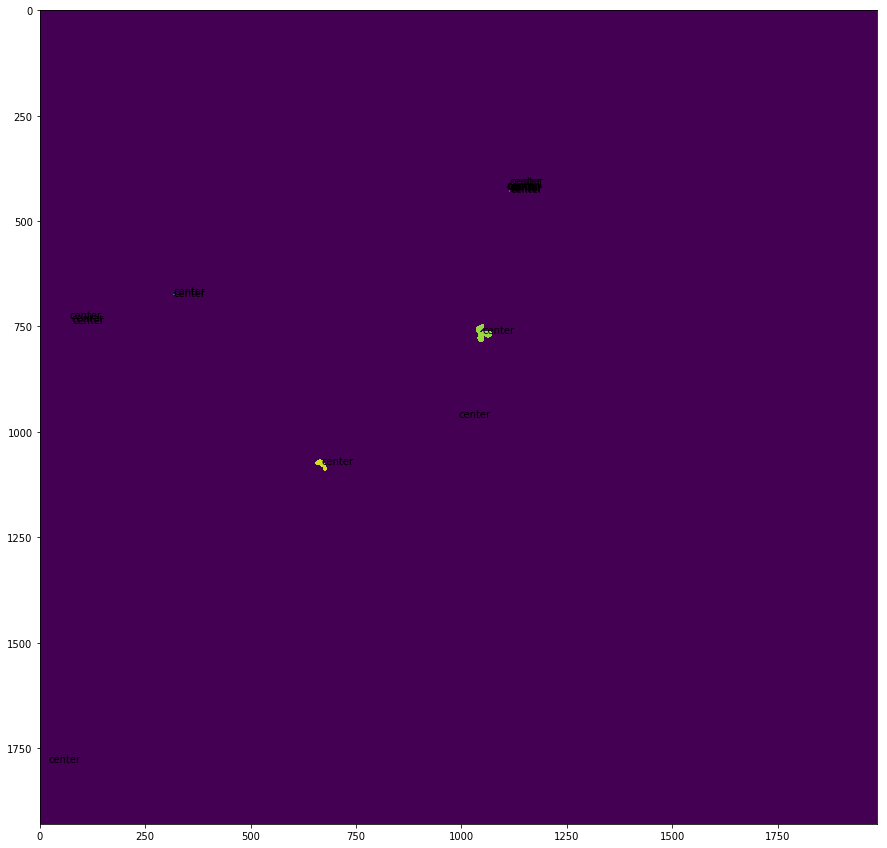

In [451]:
# Copy the thresholded image. https://docs.opencv.org/3.1.0/d3/db4/tutorial_py_watershed.html
im_th = np.array(normalize(stack[120])*255>50).astype(int)
im_floodfill = im_th
 
# Mask used to flood filling.
# Notice the size needs to be 2 pixels than the image.
h, w = im_th.shape[:2]
mask = np.zeros((h+2, w+2), np.uint8)
 
# Floodfill from point (0, 0)
cv2.floodFill(im_floodfill, mask, (0,0), 255);

# Invert floodfilled image
islands = cv2.bitwise_not(im_floodfill).astype(np.uint8)

# Marker labelling
#ret, markers = cv2.connectedComponents(islands)

connectivity = 4  # You need to choose 4 or 8 for connectivity type  https://stackoverflow.com/questions/35854197/how-to-use-opencvs-connected-components-with-stats-in-python
num_markers, markers, stats, centroids = cv2.connectedComponentsWithStats(islands , connectivity , cv2.CV_16U+cv2.CC_STAT_AREA )

# Choose markers of area within a certain range
chosen = np.where((stats[:,4]>100)* (stats[:,4]<1000))

# Add one to all labels so that sure background is not 0, but 1
markers = markers+1


plt.figure(figsize = [15,15])
plt.imshow(markers.astype(np.uint8))

# find contours in the binary image https://www.learnopencv.com/find-center-of-blob-centroid-using-opencv-cpp-python/
im2, contours, hierarchy = cv2.findContours((markers==1).astype(np.uint8),cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
for c in contours:
    # calculate moments for each contour
    M = cv2.moments(c)
 
    # calculate x,y coordinate of center
    cX = int(M["m10"] / M["m00"])
    cY = int(M["m01"] / M["m00"])
    # draw the contour and center of the shape on the image

    
    plt.text(cX, cY, 'center')


# show the image
  
plt.show()
#display.clear_output(wait=True)

# Display images.


#plt.imshow(markers)
#plt.colorbar()

#plt.show()

In [408]:
M

{'m00': 1289.0,
 'm10': 1202006.0,
 'm01': 1081533.0,
 'm20': 1169227838.0,
 'm11': 975814014.0,
 'm02': 942603263.0,
 'm30': 1168813090766.0,
 'm21': 923972738400.0,
 'm12': 819682721054.0,
 'm03': 851490116883.0,
 'mu20': 48344654.108611345,
 'mu11': -32726835.64934051,
 'mu02': 35145055.017843366,
 'mu30': -11667906329.406494,
 'mu21': 3970577273.071045,
 'mu12': -4385915303.565205,
 'mu03': 1623857442.0338135,
 'nu20': 29.09662538638473,
 'nu11': -19.696913640778845,
 'nu02': 21.152338741336017,
 'nu30': -195.596302408725,
 'nu21': 66.56123310516148,
 'nu12': -73.52380040051551,
 'nu03': 27.221722761024314}

In [395]:
set(markers.flatten())

{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14}

array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,  35,  16,   0],
       [ 22,  22,  22, ...,  48,  32,  22],
       ...,
       [218,  50, 245, ..., 213, 226,   0],
       [229,  90, 234, ..., 244, 226,   0],
       [226,   0, 232, ...,  90, 226,   0]])

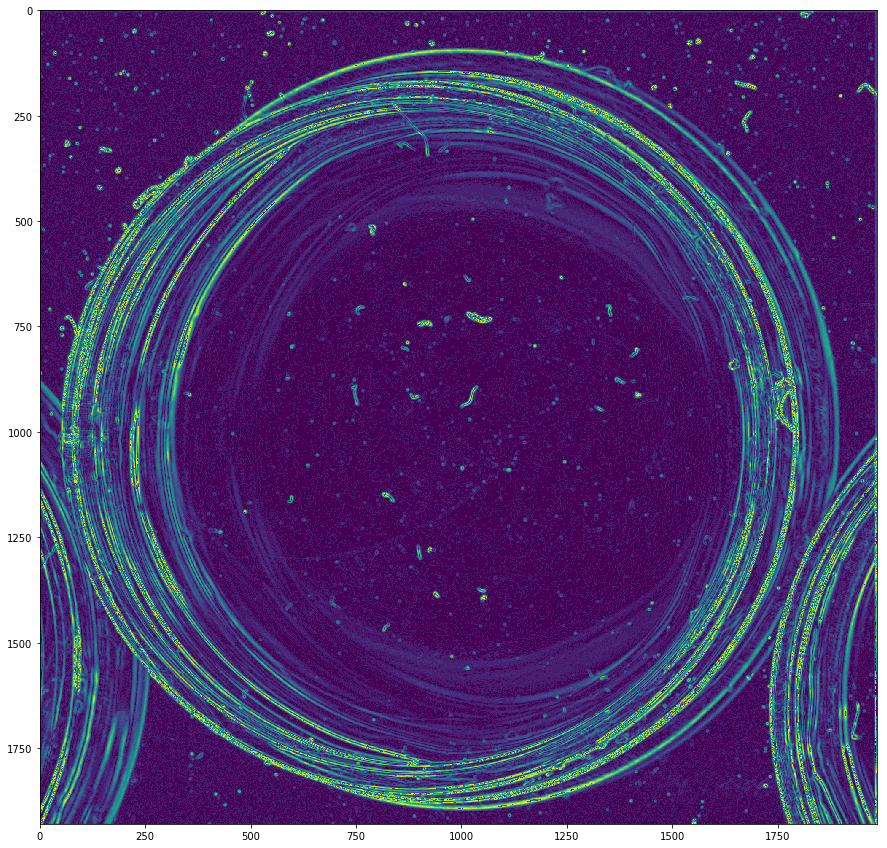

In [344]:
gray = (normalize(edge)*255).astype(int)
plt.figure(figsize = [15,15])
plt.imshow(gray)
plt.show()

In [343]:
%matplotlib inline
#### watershed  https://docs.opencv.org/3.1.0/d3/db4/tutorial_py_watershed.html
import numpy as np
import cv2
from matplotlib import pyplot as plt

edge = np.sqrt( np.square(horizontal) + np.square(vertical)) 
#gray = imRegs[100]
gray = (normalize(edge)*255).astype(int)

thresh = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,55,3)

# noise removal
kernel = np.ones((2,2),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 2)


# fill holes  https://stackoverflow.com/questions/36438313/filling-holes-of-an-image-in-python-with-cv2-not-working
im2, contours, hierarchy = cv2.findContours(opening,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

for cnt in contours:
    cv2.drawContours(opening,[cnt],0,255,-1)



# sure background area
sure_bg = cv2.dilate(opening,kernel,iterations=3)
 
# Finding sure foreground area
dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
ret, sure_fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)
 
# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)

# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
 
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
 
# Now, mark the region of unknown with zero
markers[unknown==255] = 0
    
fig, axs = plt.subplots(4, 2, figsize=(30, 30))
im1 = axs[0,0].imshow(gray+1)
fig.colorbar(im1, ax=axs[0,0])
im2 = axs[0,1].imshow(thresh+1)
fig.colorbar(im2, ax=axs[0,1])
im3 = axs[1,0].imshow(opening+1)
fig.colorbar(im3, ax=axs[1,0])
im4 = axs[1,1].imshow(sure_bg+1)
fig.colorbar(im4, ax=axs[1,1])
im5 = axs[2,0].imshow(dist_transform+1)
fig.colorbar(im5, ax=axs[2,0])
im6 = axs[2,1].imshow(sure_fg+1)
fig.colorbar(im6, ax=axs[2,1])
im7 = axs[3,0].imshow(markers+1)
fig.colorbar(im7, ax=axs[3,0])
im8 = axs[3,1].imshow(sure_bg+1)
fig.colorbar(im8, ax=axs[3,1])
#ax1 = fig.add_subplot(2,2,1)
#ax1.imshow(gray)


#ax2 = fig.add_subplot(2,2,2)
#ax2.imshow(opening)
#ax3 = fig.add_subplot(2,2,3)
#ax3.imshow(sure_fg)
#ax4 = fig.add_subplot(2,2,4)
#ax4.imshow(sure_bg)
plt.show()

error: OpenCV(3.4.2) C:\Miniconda3\conda-bld\opencv-suite_1534379934306\work\modules\imgproc\src\thresh.cpp:1524: error: (-215:Assertion failed) src.type() == (((0) & ((1 << 3) - 1)) + (((1)-1) << 3)) in function 'cv::adaptiveThreshold'


(array([      0.,       0.,       0.,       0.,       0.,       0.,
              0.,       0.,       0.,       0.,  923000., 2908050.,
              0.,       0.,       0.,       0.,       0.,       0.,
              0.]),
 array([-10,  -9,  -8,  -7,  -6,  -5,  -4,  -3,  -2,  -1,   0,   1,   2,
          3,   4,   5,   6,   7,   8,   9]),
 <a list of 19 Patch objects>)

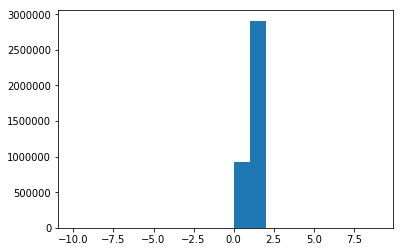

In [269]:
plt.hist(thresh.flatten()*255,range(-10,10,1))

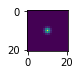

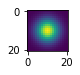

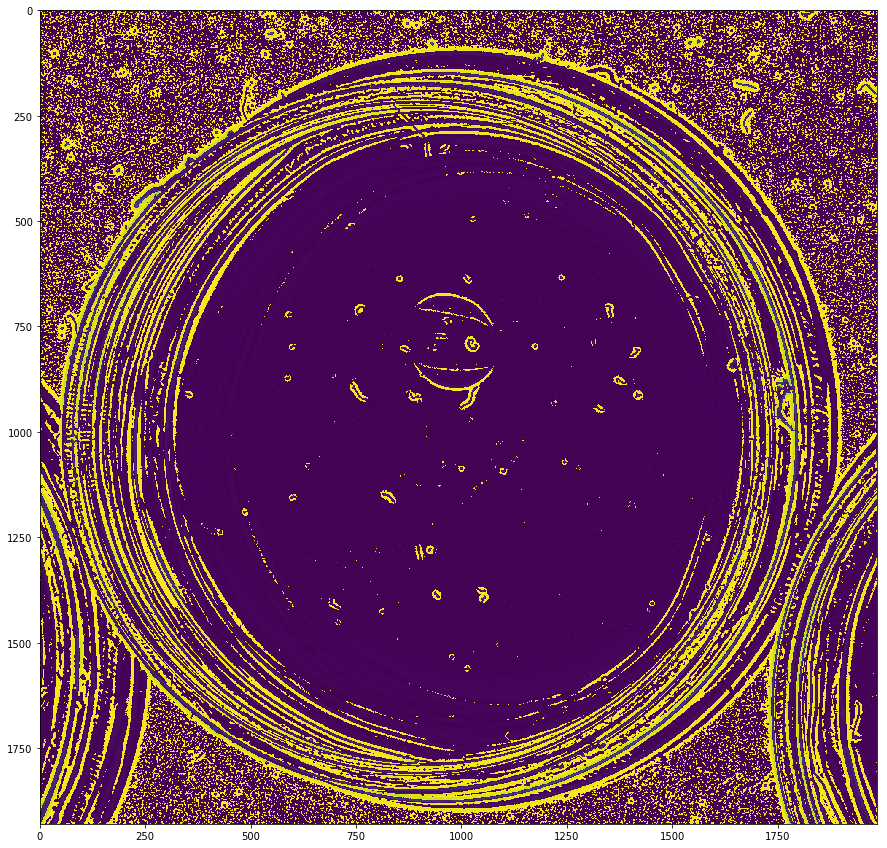

In [175]:
filtera = twodgaussian(1,10)
filterb = twodgaussian(4.,10)
plt.figure(figsize = [15/20,15/20])
plt.imshow(filtera)
plt.show()
plt.figure(figsize = [15/20,15/20])
plt.imshow(filterb)
plt.show()
plt.figure(figsize = [15,15])
plt.imshow(ndimage.convolve( imRegs[1], filtera)-ndimage.convolve( imRegs[1], filterb))
plt.show()

<IPython.core.display.Javascript object>


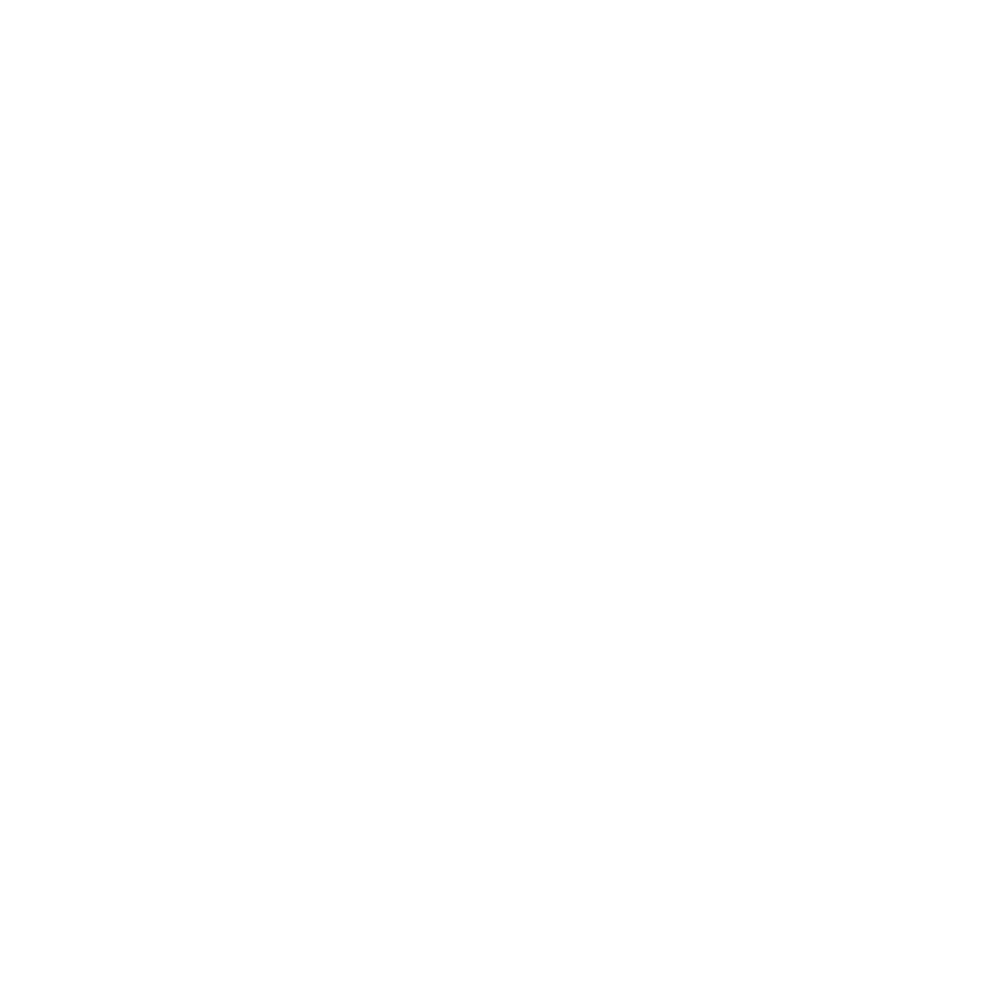

<IPython.core.display.Javascript object>


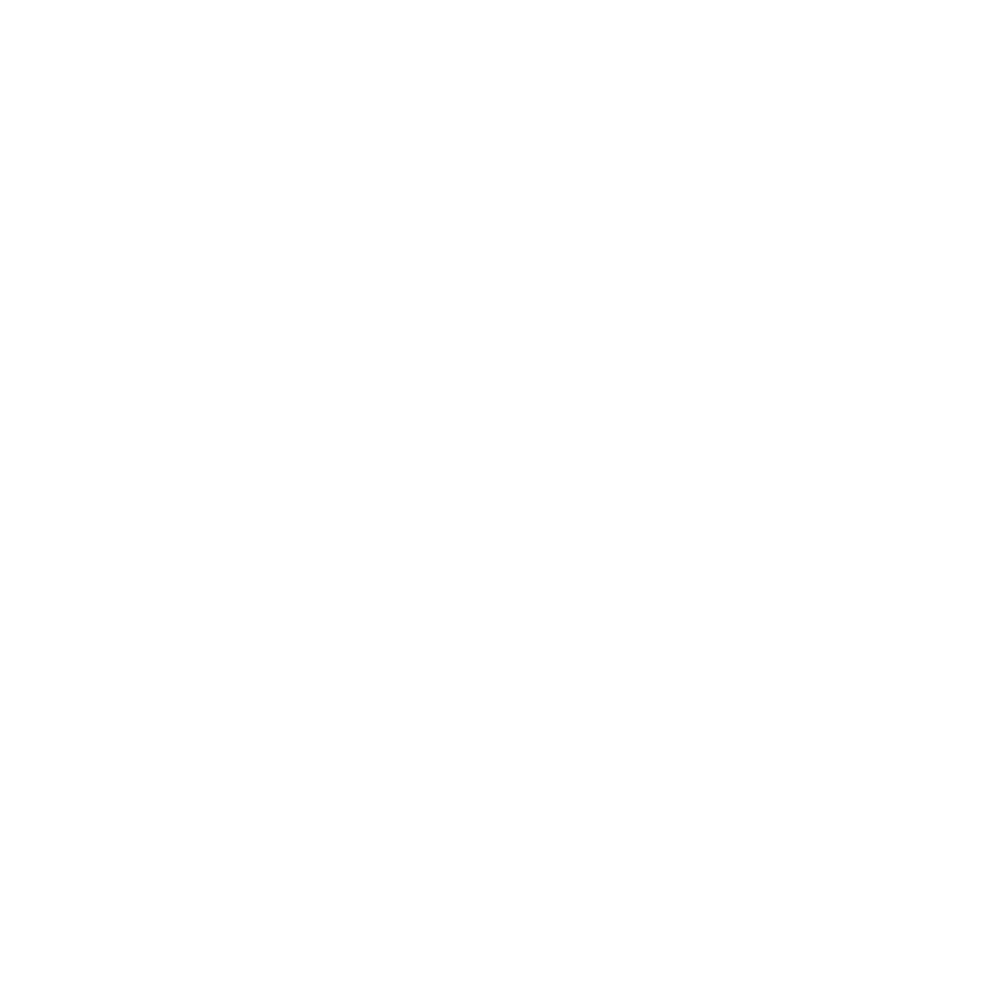

Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py", line 215, in process
    func(*args, **kwargs)
  File "C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\animation.py", line 1478, in _stop
    self.event_source.remove_callback(self._loop_delay)
AttributeError: 'NoneType' object has no attribute 'remove_callback'


In [176]:
%matplotlib notebook
%matplotlib notebook

### Roberts  https://dsp.stackexchange.com/questions/898/roberts-edge-detector-how-to-use
from scipy import ndimage
import matplotlib.animation as animation

smooth_filter = twodgaussian(1.5,3)

roberts_cross_v = np.array( [[ 1, 0],
                             [ 0, -1]])

roberts_cross_h = np.array( [[ 0, 1],
                             [ -1, 0]])


fig = plt.figure(figsize = [15,15])

plots = []

for i in range(50):
    if 'edge2' in globals():
        edge1 = edge2
    else:
        smoothed = ndimage.convolve( imRegs[i], smooth_filter )
        vertical = ndimage.convolve( smoothed, roberts_cross_v )
        horizontal = ndimage.convolve( smoothed, roberts_cross_h )
        edge1 = np.sqrt( np.square(horizontal) + np.square(vertical))

    smoothed = ndimage.convolve( imRegs[i+1], smooth_filter )
    vertical = ndimage.convolve( smoothed, roberts_cross_v )
    horizontal = ndimage.convolve( smoothed, roberts_cross_h )
    edge2 = np.sqrt( np.square(horizontal) + np.square(vertical))
    
    normalized = (normalize(edge1*2-edge2*2)*255).astype(int)
    plot =plt.imshow(ndimage.convolve(normalized,smooth_filter))
    plots.append([plot])

# create animation using the animate() function

ani = animation.ArtistAnimation(fig, plots, interval=100, blit=False,
                                repeat_delay=100)

plt.show()

<IPython.core.display.Javascript object>


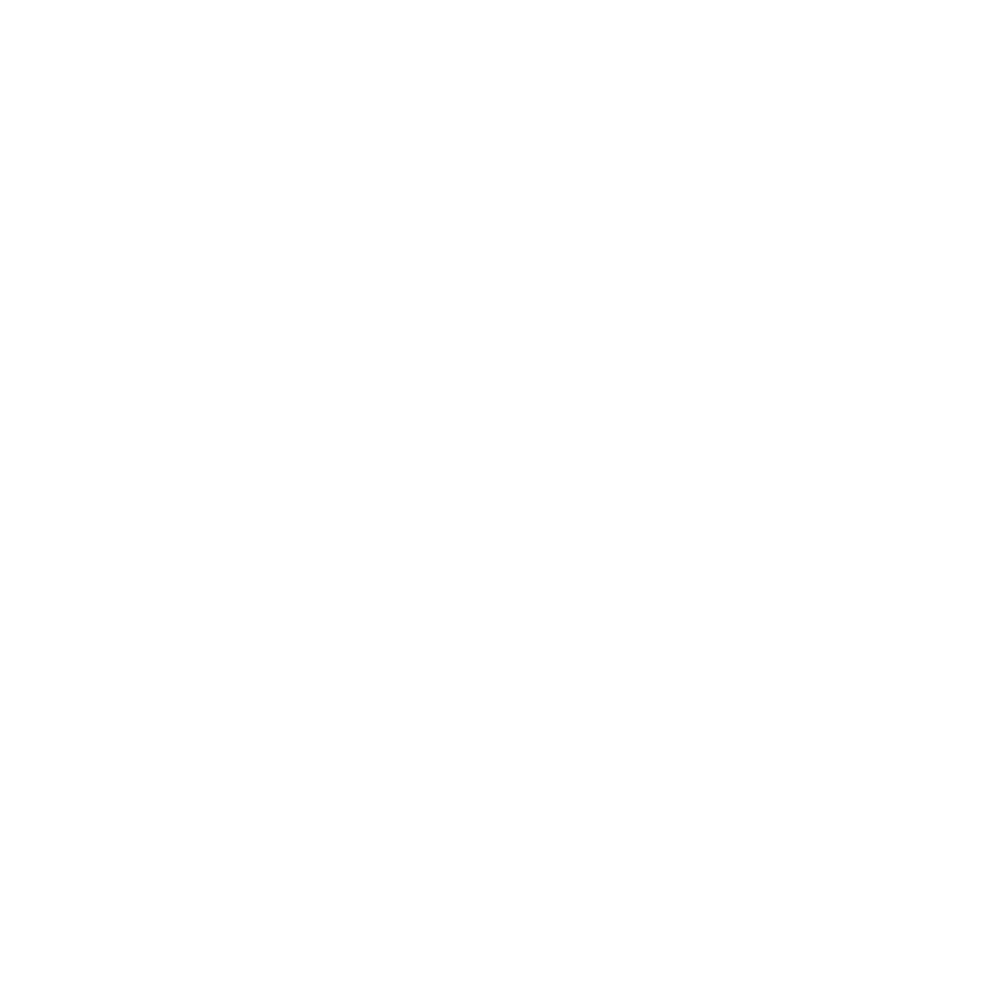

NameError: name 'circles' is not defined

<IPython.core.display.Javascript object>


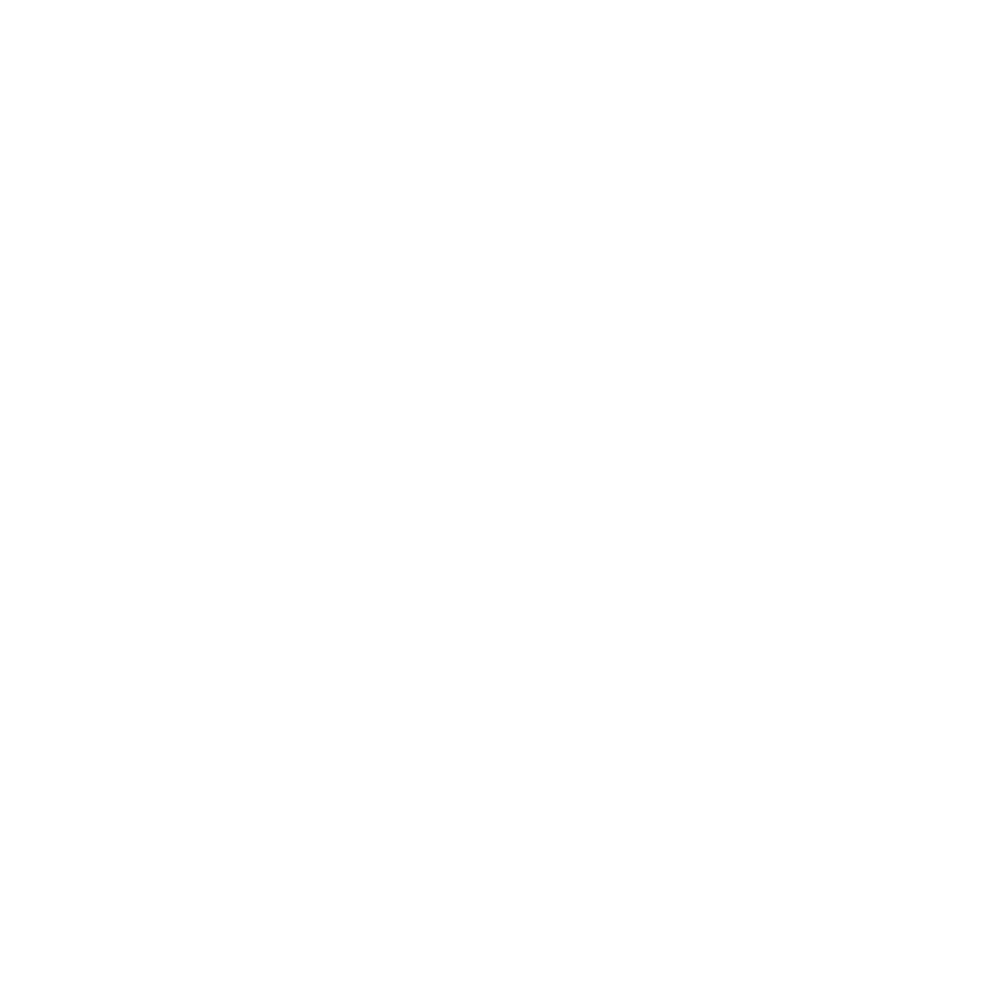

In [177]:
##### moving reference

for plateInd in [0]:
    plt.figure(figsize = [15,15])
    imRegs = list()
    bleed = 0.2
    halfside = (1+bleed)*Radius_in_pix
    left = max(0,int(circles[plateInd,0] - halfside))
    right = min(np.shape(imReference)[1],int(circles[plateInd,0] + halfside))
    top = min(np.shape(imReference)[0], int(circles[plateInd,1] + halfside))
    bottom = max(0,int(circles[plateInd,1] - halfside))
    RefPlate = imReference[bottom:top,left:right]
    plt.imshow(RefPlate)
    plt.show()

    for i in range(len(files)):
        if i%10 == 0:
            print(str(i))
        # Read image to be aligned
        imFilename = files[i]
        #print("Reading image to align : ", imFilename);  
        im = cv2.imread(imFilename,cv2.IMREAD_GRAYSCALE)
        Plate = im[bottom:top, left:right]

        #print("Aligning images ...")
        # Registered image will be resotred in imReg. 
        # The estimated homography will be stored in h. 
        imReg, h = alignImages_light(Plate, RefPlate)
        # Use previous frame as reference
        RefPlate = imReg
        
        imRegs.append(imReg)
    picklefile = '071119_plate'+str(plateInd)+'_Affine_Ref_previous.pickled'
    pickle.dump(imRegs,open(picklefile,'wb')) 

In [ ]:
smooth_filter = twodgaussian(1.5,3)
smooth_filter_2 = twodgaussian(0.5,2)

stack = []

#for i in range(50):
for i in range(3,len(imRegs)-1,1):
    fig = plt.figure(figsize = [15,15])
    smoothed = ndimage.convolve( imRegs[i], smooth_filter ) - ndimage.convolve(np.median(imRegs[i-3:i+3],axis = 0), smooth_filter)
    vertical = ndimage.convolve( smoothed, roberts_cross_v )
    horizontal = ndimage.convolve( smoothed, roberts_cross_h )
    edge = np.sqrt( np.square(horizontal) + np.square(vertical))
    
    normalized = (normalize(edge)*255).astype(int)
    plot =plt.imshow(ndimage.convolve(normalized,smooth_filter_2))
    stack.append(normalized)
    plt.text(100,200,str(i),backgroundcolor = 'w',color = 'b')
    plt.show()
    display.clear_output(wait=True)
    #if i%10 == 0:
    #    print(i)
    
time_series = ((np.array(stack)>100).astype(int).T*range(np.shape(stack)[0])).T   #colored stack

In [ ]:
#for i in range(50):
stack = np.zeros(np.shape(time_series[0]))
for i in range(50,len(time_series)-1,1):
    plt.figure(figsize = [15,15])
    stack = np.maximum(stack , time_series[i])
    plt.imshow(stack,vmax=520,cmap = colormap)
    plt.show()
    display.clear_output(wait=True)

In [ ]:
%matplotlib notebook
%matplotlib notebook

### Roberts  https://dsp.stackexchange.com/questions/898/roberts-edge-detector-how-to-use
from scipy import ndimage
import matplotlib.animation as animation

smooth_filter = twodgaussian(1.5,3)

roberts_cross_v = np.array( [[ 1, 0],
                             [ 0, -1]])

roberts_cross_h = np.array( [[ 0, 1],
                             [ -1, 0]])


fig = plt.figure(figsize = [15,15])

plots = []

#for i in range(50):
for i in range(0,len(imRegs)-1,1):
    smoothed = ndimage.convolve( imRegs[i], smooth_filter )
    vertical = ndimage.convolve( smoothed, roberts_cross_v )
    horizontal = ndimage.convolve( smoothed, roberts_cross_h )
    edge = np.sqrt( np.square(horizontal) + np.square(vertical))
    
    normalized = (normalize(edge)*255).astype(int)
    plot =plt.imshow(ndimage.convolve(normalized,smooth_filter))
    plots.append([plot])

# create animation using the animate() function

ani = animation.ArtistAnimation(fig, plots, interval=100, blit=False,
                                repeat_delay=100)

plt.show()

In [ ]:
np.median(imRegs[0:500],axis = 0)


In [ ]:
%matplotlib inline
plt.figure(figsize=[20, 20])
median = np.median(imRegs[0:500],axis = 0)
plt.imshow(median)
plt.show()

In [ ]:
%matplotlib notebook
%matplotlib notebook

### Roberts  https://dsp.stackexchange.com/questions/898/roberts-edge-detector-how-to-use
from scipy import ndimage
import matplotlib.animation as animation

smooth_filter = twodgaussian(1.5,3)

roberts_cross_v = np.array( [[ 1, 0],
                             [ 0, -1]])

roberts_cross_h = np.array( [[ 0, 1],
                             [ -1, 0]])


fig = plt.figure(figsize = [15,15])

plots = []

for i in range(500):
#for i in range(0,len(imRegs)-1,1):
    smoothed = ndimage.convolve( imRegs[i]-median, smooth_filter )
    #vertical = ndimage.convolve( smoothed, roberts_cross_v )
    #horizontal = ndimage.convolve( smoothed, roberts_cross_h )
    #edge = np.sqrt( np.square(horizontal) + np.square(vertical))
    
    #normalized = (normalize(edge)*255).astype(int)
    #plot =plt.imshow(ndimage.convolve(normalized,smooth_filter))
    plot = plt.imshow(smoothed)
    plots.append([plot])
    
# create animation using the animate() function

ani = animation.ArtistAnimation(fig, plots, interval=100, blit=False,
                                repeat_delay=100)

plt.show()

In [ ]:
from IPython.display import display
display(smoothed)

In [ ]:
%matplotlib notebook

### Roberts  https://dsp.stackexchange.com/questions/898/roberts-edge-detector-how-to-use
from scipy import ndimage
import matplotlib.animation as animation

smooth_filter = twodgaussian(1.5,3)

roberts_cross_v = np.array( [[ 1, 0],
                             [ 0, -1]])

roberts_cross_h = np.array( [[ 0, 1],
                             [ -1, 0]])


img = None
for i in range(50):
    smoothed = ndimage.convolve( imRegs[i], smooth_filter)
    if img is None:
        img = plt.imshow(smoothed)
    else:
        img.set_data(smoothed)
    plt.pause(.1)
    plt.draw()

In [ ]:
plateInd = 0
bleed = 0.2
halfside = (1+bleed)*Radius_in_pix
left = max(0,int(circles[plateInd,0] - halfside))
right = min(np.shape(imReference)[1],int(circles[plateInd,0] + halfside))
top = min(np.shape(imReference)[0], int(circles[plateInd,1] + halfside))
bottom = max(0,int(circles[plateInd,1] - halfside))
RefPlate = imReference[bottom:top,left:right]
plt.imshow(RefPlate)
plt.show()

In [ ]:
os.makedirs('..\\connected'+str(plateInd)+'\\',exist_ok=True)
os.makedirs('..\\out'+str(plateInd)+'\\',exist_ok=True)
for i in range(len(files)):

    # Read image to be aligned
    imFilename = files[i]
    print("Reading image to align : ", imFilename);  
    im = cv2.imread(imFilename,cv2.IMREAD_GRAYSCALE)
    Plate = im[bottom:top,left:right]

    print("Aligning images ...")
    # Registered image will be resotred in imReg. 
    # The estimated homography will be stored in h. 
    imReg, h = alignImages(Plate, RefPlate, ('.\\connected'+str(plateInd)+'\\').join(files[i].split('.\\')))

    # Write aligned image to disk. 
    outFilename = ('.\\out'+str(plateInd)+'\\').join(files[i].split('.\\'))
    print("Saving aligned image : ", outFilename); 
    cv2.imwrite(outFilename, imReg)


In [ ]:
imRegs = list()
for i in range(len(files)):
    if i%10 == 0:
        print(str(i))
    # Read image to be aligned
    imFilename = files[i]
    #print("Reading image to align : ", imFilename);  
    im = cv2.imread(imFilename,cv2.IMREAD_GRAYSCALE)
    Plate = im[bottom:top,left:right]

    #print("Aligning images ...")
    # Registered image will be resotred in imReg. 
    # The estimated homography will be stored in h. 
    imReg, h = alignImages(Plate, RefPlate, ('.\\connected'+str(plateInd)+'\\').join(files[i].split('.\\')))

    imRegs.append(imReg)

In [ ]:
### Canny
for i in range(20):
    plt.figure(figsize = [25,25])
    edge = cv2.Canny(imRegs[i],30,50)
    plt.imshow((edge*255).astype('int'))
    plt.show()

In [ ]:
### Canny
plt.figure(figsize = [25,25])
edge1 = cv2.Canny(imRegs[1],30,50)
edge2 = cv2.Canny(imRegs[2],30,50)
plt.imshow(((edge2-edge1)*255).astype('int'))
plt.show()

In [ ]:
### Canny
fig = plt.figure(figsize = [15,15])

plots = []

for i in range(8):
    smoothed = ndimage.convolve( imRegs[i], smooth_filter )
    edge1 = cv2.Canny(smoothed,30,50)

    smoothed = ndimage.convolve( imRegs[i+1], smooth_filter )
    edge2 = cv2.Canny(smoothed,30,50)
    
    plot =plt.imshow((normalize(edge1*2-edge2*2)*255).astype(int))
    plots.append([plot])

# create animation using the animate() function

ani = animation.ArtistAnimation(fig, plots, interval=300, blit=False,
                                repeat_delay=100)

plt.show()


In [ ]:
### Roberts  https://dsp.stackexchange.com/questions/898/roberts-edge-detector-how-to-use
from scipy import ndimage


roberts_cross_v = np.array( [[ 1, 0],
                             [ 0, -1]])

roberts_cross_h = np.array( [[ 0, 1],
                             [ -1, 0]])


vertical = ndimage.convolve( imRegs[9], roberts_cross_v )
horizontal = ndimage.convolve( imRegs[9], roberts_cross_h )

edge = np.sqrt( np.square(horizontal) + np.square(vertical))
plt.figure(figsize = [50,50])
plt.imshow((normalize(edge)*255).astype(int))
plt.show()

In [ ]:
%matplotlib inline
plt.figure(figsize = [10,10])
plt.imshow(imRegs[9])
plt.show()

In [ ]:
%matplotlib notebook
%matplotlib notebook

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

TWOPI = 2*np.pi

fig, ax = plt.subplots()

t = np.arange(0.0, TWOPI, 0.001)
s = np.sin(t)
l = plt.plot(t, s)

ax = plt.axis([0,TWOPI,-1,1])

redDot, = plt.plot([0], [np.sin(0)], 'ro')

def animate(i):
    redDot.set_data(i, np.sin(i))
    return redDot,

# create animation using the animate() function
myAnimation = animation.FuncAnimation(fig, animate, frames=np.arange(0.0, TWOPI, 0.1), \
                                      interval=10, blit=True, repeat=True)

plt.show()


In [ ]:
smooth_filter = twodgaussian(1,2)
plt.imshow(smooth_filter)
plt.show()

In [ ]:
imRegs[9]-imRegs[10]

In [ ]:
def normalize(x):
    x = (x - np.min(x))/(np.max(x)-np.min(x))
    return x

plt.figure(figsize = [10,10])
plt.imshow(normalize(imRegs[9]-imRegs[10]))
plt.show()

In [ ]:
for plateInd in [2,4]:
    bleed = 0.2
    halfside = (1+bleed)*Radius_in_pix
    left = max(0,int(circles[plateInd,0] - halfside))
    right = min(np.shape(imReference)[1],int(circles[plateInd,0] + halfside))
    top = min(np.shape(imReference)[0], int(circles[plateInd,1] + halfside))
    bottom = max(0,int(circles[plateInd,1] - halfside))
    RefPlate = imReference[bottom:top,left:right]
    plt.imshow(RefPlate)
    plt.show()

    os.makedirs('..\\connected'+str(plateInd)+'\\',exist_ok=True)
    os.makedirs('..\\out'+str(plateInd)+'\\',exist_ok=True)
    for i in range(len(files)):

        # Read image to be aligned
        imFilename = files[i]
        print("Reading image to align : ", imFilename);  
        im = cv2.imread(imFilename,cv2.IMREAD_GRAYSCALE)
        Plate = im[left:right, bottom:top]

        print("Aligning images ...")
        # Registered image will be resotred in imReg. 
        # The estimated homography will be stored in h. 
        imReg, h = alignImages(Plate, RefPlate, ('.\\connected'+str(plateInd)+'\\').join(files[i].split('.\\')))

        # Write aligned image to disk. 
        outFilename = ('.\\out'+str(plateInd)+'\\').join(files[i].split('.\\'))
        print("Saving aligned image : ", outFilename); 
        cv2.imwrite(outFilename, imReg)

In [ ]:
##backup
os.makedirs('..\\connected'+str(plateInd)+'\\',exist_ok=True)
for i in [2]:

    # Read image to be aligned
    imFilename = files[i]
    print("Reading image to align : ", imFilename);  
    im = cv2.imread(imFilename,cv2.IMREAD_GRAYSCALE)
    Plate = imReference[left:right, bottom:top]

    print("Aligning images ...")
    # Registered image will be resotred in imReg. 
    # The estimated homography will be stored in h. 
    imReg, h = alignImages(Plate, RefPlate, ('.\\connected'+str(plateInd)+'\\').join(files[i].split('.\\')))

    # Write aligned image to disk. 
    outFilename = "aligned.tif"
    print("Saving aligned image : ", outFilename); 
    cv2.imwrite(outFilename, imReg)

    # Print estimated homography
    print("Estimated homography : \n",  h)

In [ ]:
##backing up 

import os
# make folder to contain connected files
os.makedirs('..\\connected',exist_ok=True)
# Read reference image
refFilename = files[0]
print("Reading reference image : ", refFilename)
imReference = cv2.imread(refFilename,cv2.IMREAD_GRAYSCALE)
cv2.imshow('image',imReference)
for i in [2]:

    # Read image to be aligned
    imFilename = "../image002.tif"
    print("Reading image to align : ", imFilename);  
    im = cv2.imread(imFilename,cv2.IMREAD_GRAYSCALE)

    print("Aligning images ...")
    # Registered image will be resotred in imReg. 
    # The estimated homography will be stored in h. 
    imReg, h = alignImages(im.transpose(), imReference.transpose(), ('.\\connected\\').join(files[i].split('.\\')))

    # Write aligned image to disk. 
    outFilename = "aligned.tif"
    print("Saving aligned image : ", outFilename); 
    cv2.imwrite(outFilename, imReg)

    # Print estimated homography
    print("Estimated homography : \n",  h)

In [ ]:
 
if __name__ == '__main__':
   
    # Read reference image
    refFilename = "../image001.tif"
    print("Reading reference image : ", refFilename)
    imReference = cv2.imread(refFilename,cv2.IMREAD_GRAYSCALE)
    cv2.imshow('image',imReference)
    # Read image to be aligned
    imFilename = "../image002.tif"
    print("Reading image to align : ", imFilename);  
    im = cv2.imread(imFilename,cv2.IMREAD_GRAYSCALE)

    print("Aligning images ...")
    # Registered image will be resotred in imReg. 
    # The estimated homography will be stored in h. 
    imReg, h = alignImages(im, imReference)

    # Write aligned image to disk. 
    outFilename = "aligned.tif"
    print("Saving aligned image : ", outFilename); 
    cv2.imwrite(outFilename, imReg)

    # Print estimated homography
    print("Estimated homography : \n",  h)
  

In [ ]:
%matplotlib notebook

from matplotlib import pyplot as plt
import cv2
import numpy as np

refFilename = "../image001.tif"
print("Reading reference image : ", refFilename)
imReference = cv2.imread(refFilename,cv2.IMREAD_GRAYSCALE)
plt.imshow(cv2.medianBlur(imReference,101))
plt.title('my picture')
plt.show()

In [ ]:
imReg, h = alignImages(imReference, imReference)

In [ ]:
np.shape(imReg)

In [651]:
a = np.array([[[1,0,0],[0,1,0]],[[0,0,1],[0,0,0]],[[0,0,1],[0,0,0]],[[0,0,1],[0,0,0]]])

In [653]:
np.tensordot(a,[1,2,3,4],axes = ([0], [0]))

array([[1, 0, 9],
       [0, 1, 0]])

In [652]:
a

array([[[1, 0, 0],
        [0, 1, 0]],

       [[0, 0, 1],
        [0, 0, 0]],

       [[0, 0, 1],
        [0, 0, 0]],

       [[0, 0, 1],
        [0, 0, 0]]])

In [ ]:
a.T

In [ ]:
(a.T*[1,2,3,4]).T

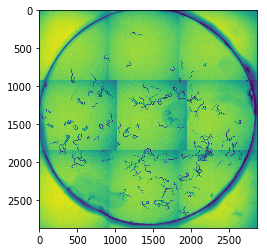

In [20]:
%matplotlib inline
import time
import pylab as pl
from IPython import display
for i in range(len(stack)):
    pl.clf()
    plt.imshow(stack[i])
    display.display(pl.gcf())
    display.clear_output(wait=True)
    time.sleep(0.01)

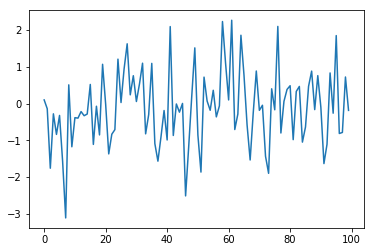

In [120]:
%matplotlib inline
#import time
#import pylab as pl
#from IPython import display
for i in range(10):
    pl.clf()
    pl.plot(pl.randn(100))
    display.display(pl.gcf())
    display.clear_output(wait=True)
    time.sleep(0.01)


In [ ]:
#for i in range(50):
stack = np.zeros(np.shape(time_series[0]))
for i in range(50,len(time_series)-1,1):
    plt.figure(figsize = [15,15])
    stack = stack + time_series[i]
    plt.imshow(stack,vmax=520,cmap = colormap)
    plt.show()
    display.clear_output(wait=True)

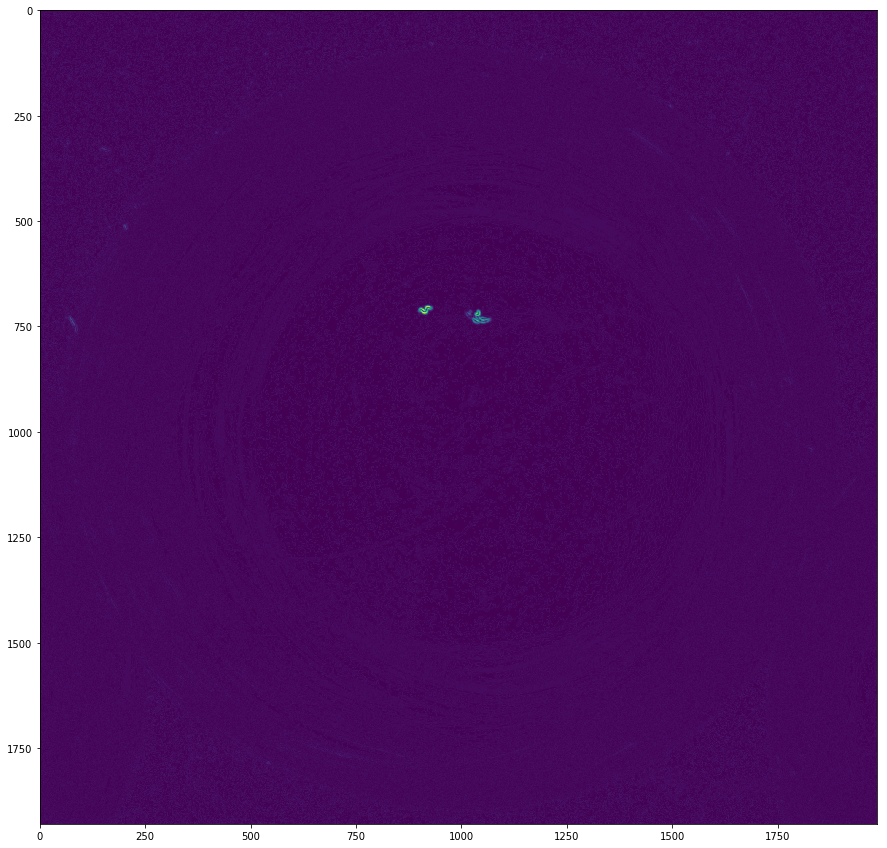

In [701]:
from scipy import ndimage

smooth_filter = twodgaussian(1.5,3)
smooth_filter_2 = twodgaussian(0.5,2)

stack = []

for i in range(3,50):
#for i in range(50,len(imRegs)-1,1):
    fig = plt.figure(figsize = [15,15])
    smoothed = ndimage.convolve( imRegs[i], smooth_filter ) - ndimage.convolve(np.median(imRegs[i-3:i+3],axis = 0), smooth_filter)
    vertical = ndimage.convolve( smoothed, roberts_cross_v )
    horizontal = ndimage.convolve( smoothed, roberts_cross_h )
    edge = np.sqrt( np.square(horizontal) + np.square(vertical))
    
    normalized = (normalize(edge)*255).astype(int)
    plot =plt.imshow(ndimage.convolve(normalized,smooth_filter_2))
    stack.append(normalized)
    plt.show()
    display.clear_output(wait=True)
    if i%10 == 0:
        print(i)
    
time_series = ((np.array(stack)>100).astype(int).T*range(np.shape(stack)[0])).T   #colored stack